# Setup cells


In [ ]:
# Step 1: Restart just like the first time
import os
#os.kill(os.getpid(), 9)


In [ ]:
# Step 2: 🔧 Setup Cell: Import all required libraries
import numpy as np #Arithmitic
import pandas as pd #Opening data
import matplotlib.pyplot as plt #Plotting
from google.colab import files #Linking with drive
import os #Filtering
import shutil
from scipy.optimize import curve_fit
import matplotlib as mpl
from math import cos, pi, sin
from IPython.display import display
from numpy import array, ones
from sympy import dsolve, Eq, Function, init_printing, plot_implicit, solve, symbols
!pip install mpl-scatter-density

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 749.5/749.5 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 3.8 MB/s eta 0:00:00


# **Moment Calculations**


## 📚 Physical Meaning of the First Four Moments of a Distribution Function

Given a 1D velocity distribution function $f(v)$, the **n-th moment** is defined as:

$$
M_n = \int (v - \langle v \rangle)^n f(v)\, dv
$$

Here’s what the first four moments represent:

---

### 🟦 **0th Moment** — Number Density

$$
M_0 = \int f(v)\, dv = n
$$

- **Physical meaning**: Total number of particles per unit volume  
- **Units**: particles/m³  
- **Interpretation**: Area under the curve of $f(v)$

---

### 🟨 **1st Moment** — Bulk Velocity

$$
\langle v \rangle = \frac{1}{n} \int v f(v)\, dv
$$

- **Physical meaning**: Average (mean) velocity of the particles  
- **Units**: m/s  
- **Interpretation**: Center of mass motion of the plasma

---

### 🟥 **2nd Moment** — Pressure / Temperature

$$
\langle (v - \langle v \rangle)^2 \rangle = \frac{1}{n} \int (v - \langle v \rangle)^2 f(v)\, dv
$$

- **Physical meaning**: Variance of velocity; related to thermal energy  
- **Units**: (m/s)²  
- **Interpretation**: Spread of the velocity distribution  
- Often used to calculate pressure:

$$
P = m n \langle (v - \langle v \rangle)^2 \rangle
$$

---

### 🟪 **3rd Moment** — Skewness

$$
\langle (v - \langle v \rangle)^3 \rangle = \frac{1}{n} \int (v - \langle v \rangle)^3 f(v)\, dv
$$

- **Physical meaning**: Asymmetry of the distribution around the mean  
- **Units**: (m/s)³  
- **Interpretation**:  
  - Positive skew → long tail toward high velocities  
  - Negative skew → long tail toward low velocities

---

### 🟫 **4th Moment** — Kurtosis
The kurtosis measures the **peakedness** and **tail weight** of a probability distribution relative to a normal (Gaussian or Maxwellian) distribution.
$$
\langle (v - \langle v \rangle)^4 \rangle = \frac{1}{n} \int (v - \langle v \rangle)^4 f(v)\, dv
$$

- **Physical meaning**: Peakedness of the distribution  
- **Units**: (m/s)⁴  
- **Interpretation**:  
  - High kurtosis → sharp peak and heavy tails  
  - Low kurtosis → flatter distribution
While **variance** (2nd moment) tells you how wide the distribution is overall, **kurtosis** tells you where the spread is coming from — **the core or the tails**.

## 🧪 Visualization Example

| **Distribution Type**     | **Description**                                                             |
|---------------------------|------------------------------------------------------------------------------|
| **Gaussian (kurtosis = 3)** | Normal distribution (Maxwellian) — Moderate peak, moderate tails                                               |
| **High kurtosis (>3)**    | Sharp peak, fat (heavy) tails — more extreme velocities
| **Low kurtosis (<3)**     | Flat peak, short (thin) tails  — fewer particles far from the mean|

---

## ✅ Summary

- **Kurtosis** is a statistical tool to identify **non-thermal features** in a plasma.
- When combined with **skewness**, it helps assess:
  - Whether a distribution is **symmetric**
  - How far it **deviates from a Maxwellian (thermal equilibrium)**  
- It is a **dimensionless** quantity when normalized by $\sigma^4$, where $ \sigma$ is the standard deviation.

---

## 📚 Summary of Moments in 1D

| Moment         | Mathematical Expression                                                                 | Physical Meaning                           |
|----------------|------------------------------------------------------------------------------------------|--------------------------------------------|
| **0th moment** | $ \displaystyle n = \int f(v)\, dv $                                                  | Number density                             |
| **1st moment** | $\displaystyle \langle v \rangle = \frac{1}{n} \int v\, f(v)\, dv $                  | Bulk (mean) velocity                       |
| **2nd moment** | $ \displaystyle \langle (v - \langle v \rangle)^2 \rangle =  \frac{1}{n} \int (v - \langle v \rangle)^2\, f(v)\, dv $ | Thermal speed or pressure (variance)       |
| **3rd moment** | $ \displaystyle \langle (v - \langle v \rangle)^3 \rangle = \frac{1}{n} \int (v - \langle v \rangle)^3\, f(v)\, dv $ | Skewness (asymmetry of distribution)       |
| **4th moment** | $ \displaystyle \langle (v - \langle v \rangle)^4 \rangle = \frac{1}{n} \int (v - \langle v \rangle)^4\, f(v)\, dv$  | Kurtosis (peakedness or flatness of tail)  |

-The thermal pressure in 1D

$$
P = m\  n\ \displaystyle \langle (v - \langle v \rangle)^2 \rangle = m \int (v - \langle v \rangle)^2 f(v)\, dv
$$

-The thermal pressure in In 3D isotropic:
$$
P =\frac{1}{3}\  n\ \displaystyle \langle (v - \langle v \rangle)^2 \rangle =\frac{1}{3} m \int (v - \langle v \rangle)^2 f(v)\, dv
$$

## 🔥 Heat Conduction (Heating) Flux in Plasma

To calculate the **heat conduction flux** $\mathbf{q}$ in a plasma or fluid, we distinguish between:

- **Classical (collisional)** heat conduction — typical in dense plasmas or gases  
- **Collisionless (kinetic)** heat flux — typical in space plasmas like the solar wind

---

### 🔬 Classical (Collisional) Plasmas

In collisional regimes, heat flux is described by **Fourier's Law**:

$$
\mathbf{q} = -\kappa \nabla T
$$

Where:

- $ \mathbf{q}$: heat flux (W/m²)  
- $\kappa$: thermal conductivity (W·m⁻¹·K⁻¹)  
- $\nabla T$: temperature gradient (K/m)

---

### ✅ Example: Fully Ionized Hydrogen (Spitzer Conductivity)

Spitzer (1962) derived the parallel thermal conductivity as:

$$
\kappa_\parallel = 1.84 \times 10^{-5} \frac{T^{5/2}}{\ln \Lambda} \quad \text{W·m}^{-1} \cdot \text{K}^{-1}
$$

Then the **parallel heat flux** becomes:

$$
q_\parallel = -\kappa_\parallel \frac{dT}{dx}
$$

Where:

- $T$: electron temperature (K)  
- $\ln \Lambda$: Coulomb logarithm (typically 10–30)

---

### 🌌 Collisionless Plasmas (e.g., Solar Wind)

In low-collisionality environments, heat flux comes from the **third moment** of the distribution function:

$$
q = \frac{1}{2} m \int (v - u)^3 f(v)\, dv
$$

Where:

- $f(v)$: particle velocity distribution function  
- $u$: bulk velocity  
- $m$: particle mass  
- $q$: 1D heat flux (W/m²)

## 🔥 Summary of Heat Conduction Approaches

| **Model Type**   | **Formula**                                                | **When to Use**                                                             |
|------------------|------------------------------------------------------------|-----------------------------------------------------------------------------|
| **Collisional**  |$\mathbf{q} = -\kappa \nabla T$                         | Dense plasmas with strong collisional coupling                             |
| **Collisionless**|$\mathbf{q} = \frac{1}{2} m \int (v - u)^3 f(v)\, dv | Collisionless environments like the solar wind or magnetospheric plasmas   |

## 📊 Quantities You Can Calculate from a 1D Distribution Function $f(v)$

---

### 🟦 Basic Fluid Moments (0th–4th)

| Quantity         | Formula                                                                                      | Physical Meaning                           |
|------------------|----------------------------------------------------------------------------------------------|--------------------------------------------|
| **Density**       | $ n = \int f(v)\, dv $                                                                     | Number of particles per unit volume        |
| **Bulk Velocity** | $ u = \langle v \rangle = \frac{1}{n} \int v f(v)\, dv $                                   | Mean flow velocity                         |
| **Pressure**      | $ P = m \int (v - u)^2 f(v)\, dv $                                                         | Thermal pressure                           |
| **Skewness**      | $ \frac{1}{n \sigma^3} \int (v - u)^3 f(v)\, dv $                                          | Distribution asymmetry                     |
| **Kurtosis**      | $ \frac{1}{n \sigma^4} \int (v - u)^4 f(v)\, dv$                                           | Peakedness or tail behavior                |

---

### 🟧 Energy-related Quantities

| Quantity              | Formula                                                                 | Meaning                                  |
|-----------------------|-------------------------------------------------------------------------|------------------------------------------|
| **Mean kinetic energy** | $ \langle E_k \rangle = \frac{1}{2} m \int v^2 f(v)\, dv $           | Average energy per particle              |
| **Thermal energy**      | $ E_{\text{th}} = \frac{1}{2} m \int (v - u)^2 f(v)\, dv $           | Energy relative to bulk motion           |
| **Energy flux**         | $ q_E = \frac{1}{2} m \int (v - u)^3 f(v)\, dv$                    | Heat conduction in 1D |

---

### 🟨 Entropy and Shape Diagnostics

| Quantity                   | Formula                                                                 | Interpretation                                  |
|----------------------------|-------------------------------------------------------------------------|------------------------------------------------|
| **Entropy (Boltzmann)**     | $ S = -k_B \int f(v) \ln f(v)\, dv $                                  | Degree of disorder (non-Maxwellian-ness)       |
| **Deviation from Maxwellian** | Use statistical divergence (e.g., KL-divergence) from a Maxwellian fit | Quantifies how non-thermal the plasma is       |

---

### 🟩 Diagnostic Fits & Features

| Quantity                    | How to Compute                                                                 | Use                                            |
|-----------------------------|--------------------------------------------------------------------------------|------------------------------------------------|
| **Maxwellian temperature fit** | Fit $ f(v) $ to a Maxwellian: $ A \exp\left(-\frac{m(v - u)^2}{2k_B T} \right) $ | Extract \( T \) assuming thermal equilibrium |
| **Bi-modal or beam detection** | Look for multi-peak structure in $ f(v) $                                     | Detect reflected, beam, or halo populations   |
| **Tail index (power law)**     | Fit $ f(v) \propto v^{-\alpha} $ in tail region                             | Quantify suprathermal particle strength       |

---

### 🧠 Convert Entropy to Entropy Per-Particle Value

To convert entropy from total (per unit volume) to **entropy per particle**, use the formula:

$$
S_{\text{per particle}} = \frac{S}{n}
$$

Where:

- $ S$: total entropy per unit volume (in J/K·m³)  
- $n$: number density (in particles/m³)

## 🧠 What Can This Tell You in Plasma Physics?

- **Heating**: temperature and heat flux show how plasma is energized  
- **Streaming or beams**: skewness and multi-peak shapes show particle flows  
- **Non-equilibrium**: kurtosis or entropy reveal deviations from Maxwellian  
- **Instabilities**: asymmetry or beams can drive kinetic instabilities (e.g., firehose, bump-on-tail)

## 🔍 What is $\sigma$?

$ \sigma$  (the Greek letter sigma) represents the **standard deviation** of the velocity distribution.

It tells you how **spread out** the particle velocities are around the **mean (bulk) velocity**.

It is the **square root of the variance**, which is the **second central moment**.

---

## 🧮 Formula

Given a distribution function \( f(v) \), bulk velocity \( u = \langle v \rangle \), and number density \( n \), the standard deviation is:

$$
\sigma = \sqrt{ \frac{1}{n} \int (v - u)^2 f(v)\, dv }
$$

**Where:**

- $f(v) $: particle distribution function in 1D  
- $ v $: velocity variable  
- $ u = \langle v \rangle$: bulk velocity  
- $ n = \int f(v)\, dv $: number density  

---

## 🧠 Physical Meaning

- **Low** $\sigma$ → particles are clustered close to the mean velocity (narrow distribution)  
- **High** $ \sigma$ → particles are more spread out (broader distribution = hotter plasma)  

---

In **kinetic theory**, $ \sigma$ is directly related to **temperature** in 1D:

$$
T = \frac{m \sigma^2}{k_B} \quad \Rightarrow \quad \sigma = \sqrt{ \frac{k_B T}{m} }
$$


# 1D Velocity DF:

In [ ]:
#The following velocity and distribution function (f) arrays are real data from Helios 2, measured on February 9, 1976, at 00:35:05.
#The two arrays each contain 32 elements, corresponding to the 32 energy channels of E1, the plasma instrument on Helios.

# As we defined the time, the distribution function doesn't depend on it
# To also reduce the dependence on theta and phi (as devices measure in spherical coordinates) we integrate w.r.to solid angle \int_0^\pi \int_0^{2\pi} r^2 \sin\theta d\theta d\phi
# So it is reduced DF F(v_r,v_\theta,v_\phi, r)

# This is a bunch of velocities of the particles at ONE moment.

v_arr=np.array([ 178.1586,   191.43102,  205.60291,  221.15424,  237.81458,  254.80132,
  274.95465,  295.68668,  317.56601,  341.42957,  366.89032,  394.73651,
  424.32901,  455.32739,  491.44302,  528.64026,  568.48553,  611.16919,
  657.01642,  707.24902,  760.2403,   815.80646,  880.4483,   947.23059,
 1019.8422,  1096.6,     1178.5919,  1268.673,   1363.6038,  1463.2292,
 1578.946,   1698.548])

f_arr=np.array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
 0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
 0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
 0.0000000e+00, 2.6393590e-19, 2.9115522e-18, 1.7339317e-17, 3.5426939e-17,
 1.7673032e-17, 1.8904058e-18, 1.9256069e-19, 5.7039686e-19, 4.7156246e-19,
 1.5959650e-19, 3.0702970e-20, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
 0.0000000e+00, 7.3913145e-21])

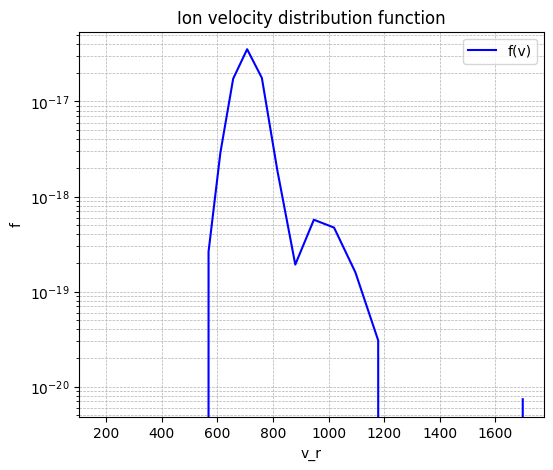

In [ ]:
plt.figure(figsize=(6, 5))
plt.plot(v_arr, f_arr, label='f(v)', color='blue')

# Log scale for y-axis
plt.yscale('log')

# Labels and title
plt.xlabel('v_r')
plt.ylabel('f')
plt.title('Ion velocity distribution function')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend()

# Show the plot
plt.show()


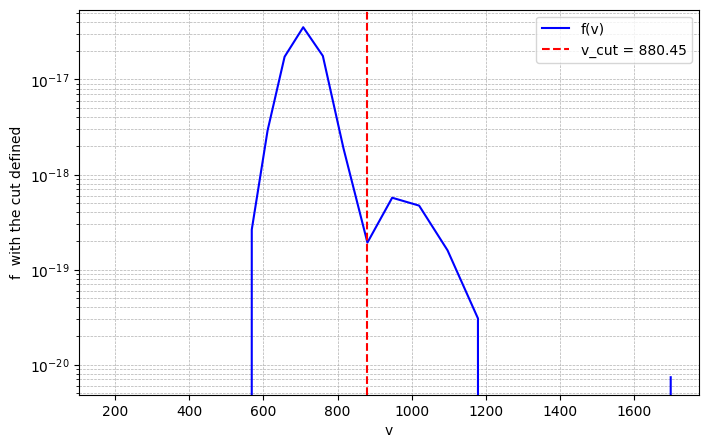

In [ ]:
#Now we aim to separate the alpha population from the protons population,
# to do this change the number of the element in the following line and
# plot until you find the perfect cut.

v_cut = v_arr[22]

# Create the plot
plt.figure(figsize=(8, 5))
plt.plot(v_arr, f_arr, label='f(v)', color='blue')

# Add vertical line at v_cut
plt.axvline(x=v_cut, color='red', linestyle='--', label=f'v_cut = {v_cut:.2f}')

# Log scale for y-axis
plt.yscale('log')

# Labels and title
plt.xlabel('v')
plt.ylabel('f  with the cut defined')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend()

# Show the plot
plt.show()


In [ ]:
# Calculate the Density

# Keep only the first x elements
v_protons = v_arr[:23] #number here is x+1
f_protons = f_arr[:23]*10**30 # converting from cm to km since v is in km # units of f (cm^-6 s^-3) )
v_protons_m = v_protons * 1e3  # convert km/s → m/s
f_protons_m = f_protons * 1e12  # convert cm⁻⁶ → m⁻⁶

#print(v_protons) #print to check!

#Compute density using trapezoidal integration
density_p = np.trapezoid(f_protons_m, v_protons_m)  #M_0

print(f"Density = {density_p:.4e} m^-3")

Density = 3.8803e+30 m^-3


In [ ]:
# Step 3: Bulk velocity (1st moment)
u_p = np.trapezoid(v_protons_m * f_protons_m, v_protons_m) / density_p   #M_1

#step 4: define constants
m_p = 1.6726e-27  # kg (proton mass)
kB = 1.3807e-23   # J/K

# Step 5: Print results
print(f"Bulk velocity   = {u_p:.4e} m/s")

Bulk velocity   = 7.0944e+05 m/s


In [ ]:
# Task (Day 2)
# For Protons

# Calculating Mass density
mass_density_proton = density_p * m_p

# 2nd Moment
variance_p = np.trapezoid((v_protons_m - u_p)**2 * f_protons_m, v_protons_m) / density_p  # M_2

# 3rd Moment
skewness_p = np.trapezoid((v_protons_m - u_p)**3 * f_protons_m, v_protons_m) / density_p    # M_3

# 4th moment
kurtosis_p = np.trapezoid((v_protons_m - u_p)**4 * f_protons_m, v_protons_m) / density_p    # M_4

# Printing Values
print(f"Mass Density = {mass_density_proton:.4e} kg.m^-3")
print(f"Variance = {variance_p:.4e} (m/s)^2")
print(f"Skewness = {skewness_p:.4e} (m/s)^3") # High energy protons dominante
print(f"Kurtosis = {kurtosis_p:.4e} (m/s)^4") # Less than 3 means fewer particles far from the mean

Mass Density = 6.4902e+03 kg.m^-3
Variance = 1.9849e+09 (m/s)^2
Skewness = 5.3442e+12 (m/s)^3
Kurtosis = 1.2593e+19 (m/s)^4


In [ ]:
# Quantities for proton :)

pressure_p = m_p * density_p * variance_p
PD_p = m_p * density_p * u_p
KE_p = 0.5 * m_p * density_p * variance_p
E_th_p = 0.5 * m_p * np.trapezoid((v_protons_m - u_p)**2 * f_protons_m, v_protons_m)
q_E_p = 0.5 * m_p * density_p * skewness_p

f_masked = np.where(f_protons_m > 0, f_protons_m, 1e-30)
S_p = -kB * np.trapezoid(f_masked * np.log(f_masked), v_protons_m)
density = np.trapezoid(f_protons_m, v_protons_m)
Sp_p = S_p / density

# Temperature in Kelvin
T_p_K = pressure_p/(density_p*kB)

sigma_p = np.sqrt(variance_p)

# Printing Values
print(f"Pressure = {pressure_p:.4e} Pa")
print(f"Momentum Density = {PD_p:.4e} Pa")
print(f"Kinetic Energy = {KE_p:.4e} J")
print(f"Thermal Energy = {E_th_p:.4e} J")
print(f"Energy Flux = {q_E_p:.4e} J/s/m²")
print(f"Entropy = {S_p:.4e} J/K")
print(f"Entropy per particle = {Sp_p:.4e} J/K/particle")
print(f"Temperature = {T_p_K:.2f} K")
print(f"Variance = {variance_p:.4e} (m/s)^2")
print(f"Standard deviation (σ) = {sigma_p:.4e} m/s")

Pressure = 1.2882e+13 Pa
Momentum Density = 4.6044e+09 Pa
Kinetic Energy = 6.4412e+12 J
Thermal Energy = 6.4412e+12 J
Energy Flux = 1.7343e+16 J/s/m²
Entropy = -3.1242e+09 J/K
Entropy per particle = -8.0513e-22 J/K/particle
Temperature = 240454.19 K
Variance = 1.9849e+09 (m/s)^2
Standard deviation (σ) = 4.4552e+04 m/s


In [ ]:
m_a = 6.64e-27  # kg (alpha mass)

In [ ]:
# For Alpha

# Keep only the first x elements
v_alpha = v_arr[23:] #number here is x+1
f_alpha = f_arr[23:]*10**30 # converting from cm to km since v is in km # units of f (cm^-6 s^-3) )
v_alpha_m = v_alpha * 1e3  # convert km/s → m/s
f_alpha_m = f_alpha * 1e12  # convert cm⁻⁶ → m⁻⁶

# 0th-Moment
density_alpha = np.trapezoid(f_alpha_m, v_alpha_m)  # M_0

# 1st Moment
u_alpha = np.trapezoid(v_alpha_m * f_alpha_m, v_alpha_m) / density_alpha  # M_1

# 2nd Moment
variance_alpha = np.trapezoid((v_alpha_m - u_alpha)**2 * f_alpha_m, v_alpha_m) / density_alpha  # M_2

# 3rd Moment
skewness_alpha = np.trapezoid((v_alpha_m - u_alpha)**3 * f_alpha_m, v_alpha_m) / density_alpha    # M_3

# 4th moment
kurtosis_alpha = np.trapezoid((v_alpha_m - u_alpha)**4 * f_alpha_m, v_alpha_m) / density_alpha    # M_4

print(f"Density = {density_alpha:.4e} cm^-3")
print(f"Bulk Velocity = {u_alpha:.4e} m/s")
print(f"Variance = {variance_alpha:.4e} (m/s)^2")
print(f"Skewness = {skewness_alpha:.4e} (m/s)^3")
print(f"Kurtosis = {kurtosis_alpha:.4e} (m/s)^4")

Density = 7.1679e+28 cm^-3
Bulk Velocity = 1.0225e+06 m/s
Variance = 6.3269e+09 (m/s)^2
Skewness = 1.9949e+15 (m/s)^3
Kurtosis = 1.3249e+21 (m/s)^4


In [ ]:
# Quantities for alpha

pressure_alpha = m_a * density_alpha * variance_alpha
KE_alpha = 0.5 * m_a * density_alpha * variance_alpha
E_th_alpha = 0.5 * m_a * np.trapezoid((v_alpha_m - u_alpha)**2 * f_alpha_m, v_alpha_m)
q_E_alpha = 0.5 * m_a * density_alpha * skewness_alpha

f_masked_alpha = np.where(f_alpha_m > 0, f_alpha_m, 1e-30)
S_alpha = -kB * np.trapezoid(f_masked_alpha * np.log(f_masked_alpha), v_alpha_m)
Sp_alpha = S_alpha / density_alpha

T_a_K = pressure_alpha/(density_alpha*kB)

# Standard deviation (sigma)
sigma_alpha = np.sqrt(variance_alpha)

# Printing Values
print(f"Pressure = {pressure_alpha:.4e} Pa")
print(f"Kinetic Energy = {KE_alpha:.4e} J")
print(f"Thermal Energy = {E_th_alpha:.4e} J")
print(f"Energy Flux = {q_E_alpha:.4e} J/s/m²")
print(f"Entropy = {S_alpha:.4e} J/K")
print(f"Entropy per particle = {Sp_alpha:.4e} J/K/particle")
print(f"Temperature = {T_a_K:.2f} K")
print(f"Variance = {variance_alpha:.4e} (m/s)^2")
print(f"Standard deviation (σ) = {sigma_alpha:.4e} m/s")

Pressure = 3.0113e+12 Pa
Kinetic Energy = 1.5056e+12 J
Thermal Energy = 1.5056e+12 J
Energy Flux = 4.7472e+17 J/s/m²
Entropy = -5.3687e+07 J/K
Entropy per particle = -7.4900e-22 J/K/particle
Temperature = 3042727.54 K
Variance = 6.3269e+09 (m/s)^2
Standard deviation (σ) = 7.9542e+04 m/s


## Fitting The Data

We now fit the data with 4 different types of distributions:

1. **Maxwellian Distribution**

$$ f = A  \exp\Big(-\frac{(v-v_0)^2}{2v_{th}^2} \Big)$$

2. **Bi Maxwellian Distribution**

$$ f = A_1 \exp\Big(-\frac{(v-v_{0_1})^2}{2 v_{th_1}^2} \Big) + A_2 \exp\Big(-\frac{(v-v_{0_2})^2}{2 v_{th_2}^2} \Big) $$

3. **Kappa Distribution**

$$ f = A  \Big(1 + \frac{(v-v_0)^2}{\kappa  v_{th}^2} \Big)^{-(\kappa+1)} $$

4. **Gaussian Distribution**

$$f = A \exp\Big(-\frac{(v-\mu)^2}{2\sigma^2}\Big) $$



/tmp/ipython-input-3634214836.py:12: RuntimeWarning: invalid value encountered in power
  return A * (1 + (v-v0)**2 / (kappa * vth**2))**(-(kappa+1))


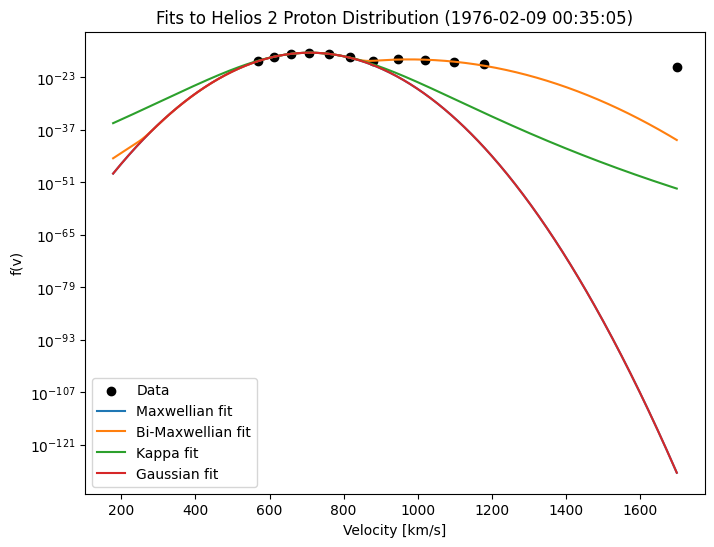

Maxwellian params: [ 3.54162309e-17  7.08982779e+02 -4.35673024e+01]
Bi-Maxwellian params: [3.54219095e-17 7.08964765e+02 4.35414188e+01 5.83818237e-19
 9.77147118e+02 7.24962635e+01]
Kappa params: [3.54594308e-17 7.09000227e+02 6.18971838e+01 4.12976620e+01]
Gaussian params: [ 3.54162309e-17  7.08982779e+02 -4.35673024e+01]


In [ ]:
from scipy.optimize import curve_fit

# Models
def maxwellian(v, A, v0, vth):
    return A * np.exp(-(v-v0)**2 / (2*vth**2))

def bi_maxwellian(v, A1, v01, vth1, A2, v02, vth2):
    return (A1 * np.exp(-(v-v01)**2 / (2*vth1**2)) +
            A2 * np.exp(-(v-v02)**2 / (2*vth2**2)))

def kappa(v, A, v0, vth, kappa):
    return A * (1 + (v-v0)**2 / (kappa * vth**2))**(-(kappa+1))

def gaussian(v, A, mu, sigma):
    return A * np.exp(-(v-mu)**2 / (2*sigma**2))

# Curve fitting
popt_max, _ = curve_fit(maxwellian, v_arr, f_arr, p0=[1e-17, 600, 100])
popt_bi,  _ = curve_fit(bi_maxwellian, v_arr, f_arr, p0=[1e-17, 600, 50, 1e-18, 700, 200])
popt_kap, _ = curve_fit(kappa, v_arr, f_arr, p0=[1e-17, 600, 100, 4])
popt_gau, _ = curve_fit(gaussian, v_arr, f_arr, p0=[1e-17, 600, 100])

# Plot
plt.figure(figsize=(8,6))
plt.scatter(v_arr, f_arr, label="Data", color="k")

v_fit = np.linspace(min(v_arr), max(v_arr), 500)
plt.plot(v_fit, maxwellian(v_fit, *popt_max), label="Maxwellian fit")
plt.plot(v_fit, bi_maxwellian(v_fit, *popt_bi), label="Bi-Maxwellian fit")
plt.plot(v_fit, kappa(v_fit, *popt_kap), label="Kappa fit")
plt.plot(v_fit, gaussian(v_fit, *popt_gau), label="Gaussian fit")

plt.yscale("log")
plt.xlabel("Velocity [km/s]")
plt.ylabel("f(v)")
plt.legend()
plt.title("Fits to Helios 2 Proton Distribution (1976-02-09 00:35:05)")
plt.show()

# Print best-fit parameters
print("Maxwellian params:", popt_max)
print("Bi-Maxwellian params:", popt_bi)
print("Kappa params:", popt_kap)
print("Gaussian params:", popt_gau)


#Data imported from helios 2  (1974-1980)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Step 2: Set up folders (one local, one in Drive)

local_folder = "/content/drive"
drive_folder = "/content/drive/My Drive/SWHA"

os.makedirs(local_folder, exist_ok=True)
os.makedirs(drive_folder, exist_ok=True)

In [ ]:
 # Step 3: Upload the CSV file ONCE (only if it's not already saved in Drive)

 # Check if the file already exists in Drive
 drive_file_path = os.path.join(drive_folder, "Helios2_solar_wind_data.csv")

 if not os.path.exists(drive_file_path):
     print("Upload the CSV file from your computer (only once needed):")
     uploaded = files.upload()  # This opens a file browser to upload the file

     # Move it to local folder
     for filename in uploaded:
         shutil.move(filename, os.path.join(local_folder, filename))

     # Copy it to Drive for future use
     shutil.copy(os.path.join(local_folder, "Helios2_solar_wind_data.csv"), drive_file_path)
 else:
     print("CSV file already exists in Drive. No need to upload.")


CSV file already exists in Drive. No need to upload.


In [ ]:
mu0 = 4 * np.pi * 1e-7
kB = 1.3807e-23
gamma = 1
e = 1.6e-19
m_p = 1.6726e-27

In [ ]:
Helios2 = pd.read_csv(drive_file_path)


## **Data**
Now you have solar wind core protons data and magnetic field data measured by helios 2 from 1974 to 1980.
The data are defined by the column names as the following,

| Quantity | Symbol | Units | Key | Formula|Meaning|
|---------|--------|-------|-----|-----|-----|
| Radial Distance | — | AU | `Helios2['r_sun']` | — | Distance of spacecraft from the Sun |
| Colatitude | — | - | `Helios2['clat']` | — | Angle from the north pole. |
| Longitude | — | AU | `Helios2['clong']` | — | Measured in the ecliptic plane from a reference direction |
| x-component magnetic field | $ B_x $ | nT | `Helios2['Bx']` |—| Radial component of $\vec{B}$ (Sun–spacecraft line).|
| y-component magnetic field | $ B_y $ | nT | `Helios2['By']` |—|Tangential (in-plane) component of $\vec{B}$.|
| z-component magnetic field | $ B_z $ | nT | `Helios2['Bz']` |—|Normal (out-of-plane) component of $\vec{B}$|
| Proton core density | $ n_p $ | cm$^{-3}$ | `Helios2['n_p']`|—|Number density of core protons.|
| Parallel proton temperature | $ T_{\parallel p} $ | K | `Helios2['Tp_par']` |—|Proton temperature along $\vec{B}$|
| Perpendicular proton temperature | $ T_{\perp p} $ | K | `Helios2['Tp_perp']` |—|Proton temperature perpendicular to $\vec{B}$.|
| x-component proton velocity | $ v_{px} $ | km/s | `Helios2['vp_x']` |—|Radial (outflow) proton velocity.|
| y-component proton velocity | $ v_{py} $ | km/s | `Helios2['vp_y']` |—|Tangential velocity of protons.|
| z-component proton velocity | $ v_{pz} $ | km/s | `Helios2['vp_z']` |—|Normal velocity of protons.|
| Parallel proton thermal velocity | $ v_{th p \parallel} $ | km/s | `Helios2['vth_p_par']` |$v_{th\parallel} = \sqrt{\tfrac{k_B T_{\parallel}}{m_p}}$|Thermal spread of protons parallel to $\vec{B}$.|
| Perpendicular proton thermal velocity | $ v_{th p \perp} $ | km/s | `Helios2['vth_p_perp']`|$v_{th\perp} = \sqrt{\tfrac{k_B T_{\perp}}{m_p}}$|Thermal spread of protons perpendicular to $\vec{B}$.|
| x-component | $x$ | $AU$ | `Helios2['x']`|$x = r \sin(clat) \cos(clong)$|-|
| y-component | $y$ | $AU$ | `Helios2['y']`|$y = r \sin(clat) \sin(clong)$|-|
| z-component | $z$ | $AU$ | `Helios2['z']`|$z = r \cos(clat)$|-|
| Radial magnetic field | $ B_r $ | nT | `Helios2['B_r']` |$B_r = B_x$|Radial component of $\vec{B}$|
| Tangential magnetic field | $ B_t $ | nT | `Helios2['B_tan']`|$B_t = \sqrt{B_y^2 + B_z^2}$| Transverse component of $\vec{B}$|
| Magnetic field magnitude | $ B $ | nT | `Helios2['B']` |$B = \sqrt{ B_x^2 + B_y^2 + B_z^2}$| Total magnetic field magnitude.|
| Parallel specific entropy | $ S_{\parallel} $ | $J/K$ | `Helios2['S_par']` |$S_{\parallel} = k_B \ln!\Big(\tfrac{T_{\parallel}}{n_p^{2/3}}\Big)$|Proton entropy along $\vec{B}$.|
| Perpendicular specific entropy | $ S_{\perp} $ | $J/K$ | `Helios2['S_perp']` |$S_{\perp} = k_B \ln!\Big(\tfrac{T_{\perp}}{n_p^{2/3}}\Big)$|Proton entropy perpendicular to $\vec{B}$|
| Radial velocity | $ V_r $ | km/s | `Helios2['V_r']` |$V = \sqrt{v_{px}^2 + v_{py}^2 + v_{pz}^2}$|Outward bulk speed (radial flow).|
| Radial density flux | $ f_r $ | #/s | `Helios2['flux_r']` | $\Phi_r = V_r , n_p$|Particle flux through a spherical surface.|
| Total proton temperature | $ T_p $ | K | `Helios2['Tp']` | $T_p = \tfrac{2T_{\parallel} + T_{\perp}}{3}$|Average proton temperature.|
|Parallel particle pressure	|$P_{\parallel}$|Pa|	`Helios2['P_k_par']`|$P_{\parallel} = n_p k_B T_{\parallel}$|	Proton pressure along $\vec{B}$.|
|Perpendicular particle pressure|	$P_{\perp}$|	Pa|	`Helios2['P_k_perp']`|	$P_{\perp} = n_p k_B T_{\perp}$	|Proton pressure perpendicular to $\vec{B}$.|
|Magnetic pressure|	$P_B$|	Pa|	`Helios2['P_B']`|	$P_B = \tfrac{B^2}{2\mu_0}$	|Magnetic energy density as pressure|
|Parallel beta parameter|$\beta_{\parallel}$|	-| `Helios2['beta_par']`|$\beta_{\parallel} = \tfrac{P_{\parallel}}{P_B}$|	Ratio of plasma to magnetic pressure (‖)|
|Perpendicular beta parameter	|$\beta_{\perp}$|-|	`Helios2['beta_perp']`|	$\beta_{\perp} = \tfrac{P_{\perp}}{P_B}$|Ratio of plasma to magnetic pressure (⊥)|
|Sound speed	|$c_s$|	km/s|	`Helios2['cs']`|	$c_s = \sqrt{\tfrac{\gamma k_B T_p}{m_p}}$|	Propagation speed of ion-acoustic waves.|
|Mach number|	$M$|-|	`Helios2['M']`|	$M = \tfrac{V_r}{c_s}$|	Ratio of flow speed to sound speed|
|Temperature anisotropy|	$A$|	—|	`Helios2['A']`|	$A = \tfrac{T_{\perp}}{T_{\parallel}}$|	Ratio of perpendicular to parallel temperatures.|
|Gyrofrequency|	$\omega_c$|	Hz|	`Helios2['omega_c']`|	$\omega_c = \tfrac{qB}{m_p}$|	Proton cyclotron frequency.|
|Time of gyration	|$\tau$	|s	|`Helios2['tau']'|`	$\tau = \tfrac{2\pi}{\omega_c}$	|Proton gyroperiod|
|Parallel heat flux|	$Q_{\parallel}$	|$J m^{-2} s^{-1}$|	`Helios2['Q_par']`	|$Q_{\parallel} = n_p k_B T_{\parallel} V_r$	| Energy flux along $\vec{B}$|
|Perpendicular heat flux|	$Q_{\perp}$| $J m^{-2} s^{-1}$|`Helios2['Q_perp']`	|$Q_{\perp} = n_p k_B T_{\perp} V_r$	|Energy flux perpendicular to $\vec{B}$|

In [ ]:
# Density
Helios2['rho'] = m_p * Helios2['n_p'] * 1e-6
Helios2['n_p'] = Helios2['n_p'] * 1e-6

# Magnetic Field Parameters:
Helios2['B'] = np.sqrt(Helios2['Bx']**2 + Helios2['By']**2 + Helios2['Bz']**2) * 1e-9
Helios2['B_r'] = Helios2['Bx'] * 1e-9
Helios2['B_tan'] = np.sqrt(Helios2['By']**2 + Helios2['Bz']**2) * 1e-9

# Proton's Temperature
Helios2['Tp'] = (2*Helios2['Tp_par'] + Helios2['Tp_perp'])/3

# Particle Pressure
Helios2['P_k_perp'] = Helios2['n_p'] * kB * Helios2['Tp_perp']
Helios2['P_k_par'] = Helios2['n_p'] * kB * Helios2['Tp_par']
Helios2['P_k'] = Helios2['n_p'] * kB * Helios2['Tp']

# Magnetic Pressure
Helios2['P_B'] = (Helios2['B']**2)/(2*mu0) * (1e-9)**2

# Beta Parameter
Helios2['beta_par'] = Helios2['P_k_par']/Helios2['P_B']
Helios2['beta_perp'] = Helios2['P_k_perp']/Helios2['P_B']
Helios2['beta'] = Helios2['P_k']/Helios2['P_B']

# Speeds
Helios2['cs'] = np.sqrt(gamma * kB * Helios2['Tp'] / m_p)
Helios2['V_r'] = Helios2['vp_x'] * 1e3
Helios2['v_Ax'] = (Helios2['Bx'])/(np.sqrt(mu0*Helios2['rho'])) * 1e-9
Helios2['v_Ay'] = (Helios2['By'])/(np.sqrt(mu0*Helios2['rho'])) * 1e-9
Helios2['v_Az'] = (Helios2['Bz'])/(np.sqrt(mu0*Helios2['rho'])) * 1e-9
Helios2['v_A'] = np.sqrt(Helios2['v_Ax']**2 + Helios2['v_Ay']**2 + Helios2['v_Az']**2) * 1e-9

# Entropy
Helios2['S_par'] = kB * np.log(Helios2['Tp_par'] / ((Helios2['n_p'])**(2/3)))
Helios2['S_perp'] = kB * np.log(Helios2['Tp_perp'] /((Helios2['n_p'])**(2/3)))
Helios2['S'] = kB * np.log(Helios2['Tp'] / ((Helios2['n_p'])**(2/3)))

# Heating Rates and Fluxes
Helios2['Q_par'] = (3/2) * kB * Helios2['n_p'] * Helios2['Tp_par'] * Helios2['V_r'] * 1e3
Helios2['Q_perp'] = (3/2) * kB * Helios2['n_p'] * Helios2['Tp_perp'] * Helios2['V_r'] * 1e3
Helios2['Q'] = (3/2) * kB * Helios2['n_p'] * Helios2['Tp'] * Helios2['V_r'] * 1e3
Helios2['flux_r'] = Helios2['n_p'] * Helios2['V_r'] * 1e3

# Ratios
Helios2['A'] = Helios2['Tp_perp']/Helios2['Tp_par']
Helios2['M'] = Helios2['V_r']* 1e3/Helios2['cs']

# Parameters
Helios2['omega_c'] = (e*Helios2['B']* 1e-9)/m_p
Helios2['tau'] = (2*np.pi)/Helios2['omega_c']

Helios2.head()

,Time,B instrument,Bx,By,Bz,sigma B,Ion instrument,Status,Tp_par,Tp_perp,...,S_perp,S,Q_par,Q_perp,Q,flux_r,A,M,omega_c,tau
0,1976-04-05 00:01:21,1,23.83600,0.705618,0.685393,3.72097,1,1,107061.0,343451.0,...,2.767928e-22,2.683144e-22,2.085950e-14,6.691714e-14,3.621204e-14,9407.668026,3.207994,13689.098662,2.282080e-09,2.753272e+09
1,1976-04-05 00:02:42,1,22.19540,-7.965520,1.013790,3.53517,1,1,117018.0,369263.0,...,2.768436e-22,2.684529e-22,2.589410e-14,8.171163e-14,4.449994e-14,10684.580843,3.155609,13481.089951,2.257873e-09,2.782789e+09
2,1976-04-05 00:04:03,1,13.72200,-8.123080,16.582400,3.56085,1,1,103427.0,383388.0,...,2.775814e-22,2.683703e-22,2.380792e-14,8.825231e-14,4.528939e-14,11114.680992,3.706846,14520.197550,2.200695e-09,2.855091e+09
3,1976-04-05 00:05:24,1,6.03218,1.362070,21.446000,6.70185,1,1,124121.0,306238.0,...,2.756266e-22,2.686549e-22,2.630064e-14,6.489036e-14,3.916388e-14,10231.292365,2.467254,15621.346946,2.135100e-09,2.942807e+09
4,1976-04-05 00:06:45,1,12.35820,4.762640,18.670300,7.36371,1,1,187078.0,252321.0,...,2.737115e-22,2.710992e-22,3.280735e-14,4.424883e-14,3.662118e-14,8467.551021,1.348748,13207.993445,2.189720e-09,2.869402e+09


# **Data Visualization:** SW: Heating, Escaping, and Accelerating.

In [ ]:
mpl.rcParams['text.usetex'] = False

# Define all quantities to plot

magnetic_field ={
    'B_r':       ('Radial Magnetic Field $B_r$ [T]', 'B_r'),
    'B_tan':     ('Tangential Magnetic Field $B_{tang}$ [T]', 'B_tan'),
    'B':         ('Magnetic Field Magnitude $B$ [T]', 'B'),
    'sigma B':  ('Variance in Magnetic Field [T]', 'sigma B'),
}

entropy = {
    'S_par':     ('Parallel Entropy $S_\\parallel$ [J/m$^{-2}$]', 'S_par'),
    'S_perp':    ('Perpendicular Entropy $S_\\perp$ [J/m$^{-2}$]', 'S_perp'),
    'S':    ('Entropy $S$ [J/m$^{-2}$]', 'S'),
}

pressure = {
    'P_k_perp': (' Perpendicular Particle Pressure $P_k$ [Pa]', 'P_k_perp'),
    'P_k_par': (' Parallel Particle Pressure $P_k$ [Pa]', 'P_k_par'),
    'P_k': ('Particle Pressure $P$ [Pa]', 'P_k'),
    'P_B': ('Magnetic Pressure $P_B$ [Pa]', 'P_B'),
}

Temperature ={
    'Tp_par':    ('Parallel Temperature $T_{\\parallel p}$ [K]', 'Tp_par'),
    'Tp_perp':   ('Perpendicular Temperature $T_{\\perp p}$ [K]', 'Tp_perp'),
    'Tp':        ('Total Proton Temperature $T_p$ [K]', 'Tp'),
}

velocity = {
    'vth_p_par': ('Parallel Thermal Velocity $v_{th\\parallel}$ [m/s]', 'vth_p_par'),
    'vth_p_perp':('Perpendicular Thermal Velocity $v_{th\\perp}$ [m/s]', 'vth_p_perp'),
    'V_r':       ('Radial Velocity $V_r$ [m/s]', 'V_r'),
    'v_Ax':       ('X-Alfven Velocity $V_{A_x}$ [m/s]', 'v_Ax'),
    'v_Ay':       ('Y-Alfven Velocity $V_{A_y}$ [m/s]', 'v_Ay'),
    'v_Az':       ('Z-Alfven Velocity $V_{A_z}$ [m/s]', 'v_Az'),
    'v_A':       ('Alfven Velocity $V_{A}$ [m/s]', 'v_A'),
}

density = {
    'n_p':       ('Proton Core Density $n_p$ [m$^{-3}$]', 'n_p'),
}

other_quantities = {
    'flux_r':    ('Radial Density Flux $f_r$ [s$^{-1}$]', 'flux_r'),
    'beta_par':      ('Parallel Beta Parameter $\\beta_\\parallel$', 'beta_par'),
    'beta_perp':      ('Perpendicular Beta Parameter $\\beta_\\perp$', 'beta_perp'),
    'beta':      ('Beta Parameter $\\beta$', 'beta'),
    'M': ('Mach Number $M$', 'M'),
    'A': ('Anisotropy $A$', 'A'),
    'omega_c': ('Gyrofrequency $\omega_c$ [rad/s]', 'omega_c'),
    'tau': ('Time of Gyration $\tau$ [s]', 'tau'),
    'Q_par': ('Parallel Heat Flux $Q_{\\parallel}$ [W]', 'Q_par'),
    'Q_perp': ('Perpendicular Heat Flux $Q_{\\perp}$ [W]', 'Q_perp'),
    'Q': ('Heat Flux $Q$ [W]', 'Q'),
}

<>:52: SyntaxWarning: invalid escape sequence '\o'
<>:52: SyntaxWarning: invalid escape sequence '\o'
/tmp/ipython-input-2328640111.py:52: SyntaxWarning: invalid escape sequence '\o'
  'omega_c': ('Gyrofrequency $\omega_c$ [rad/s]', 'omega_c'),


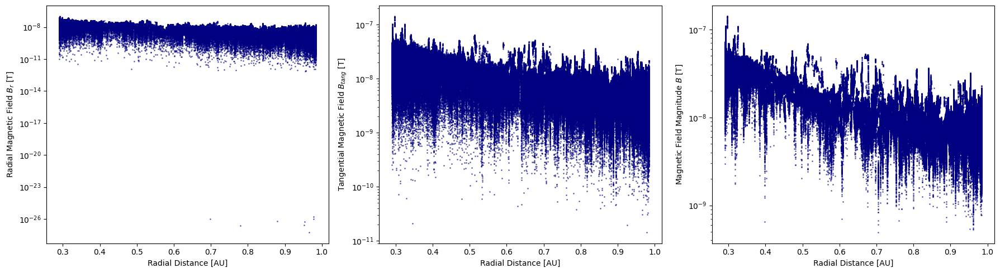

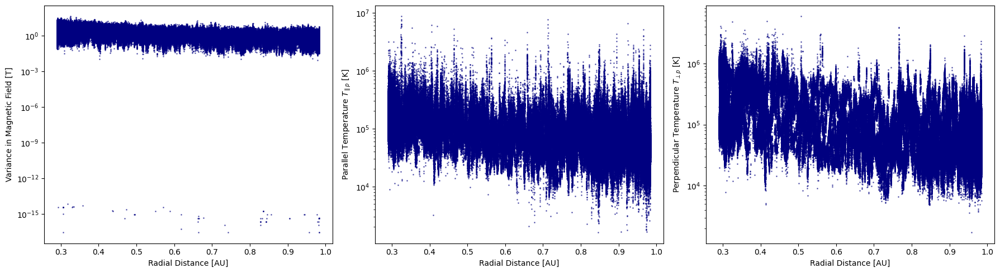

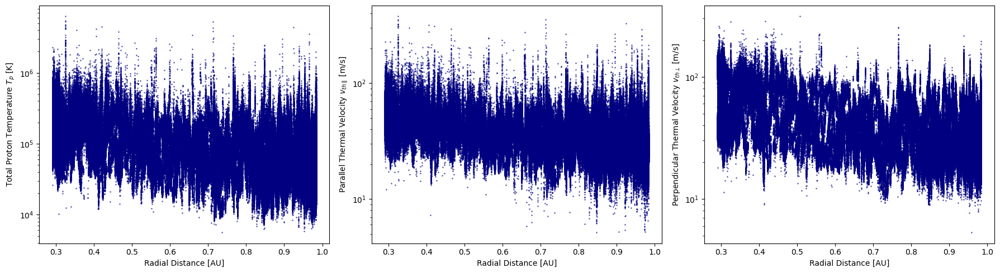

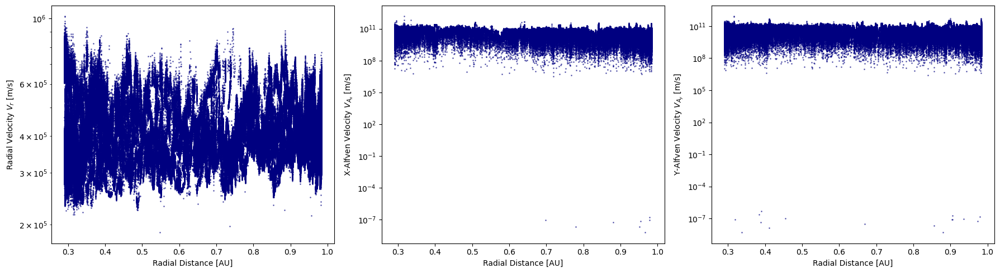

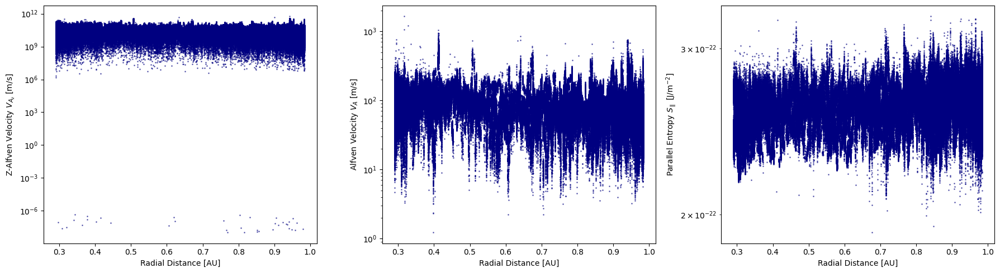

...

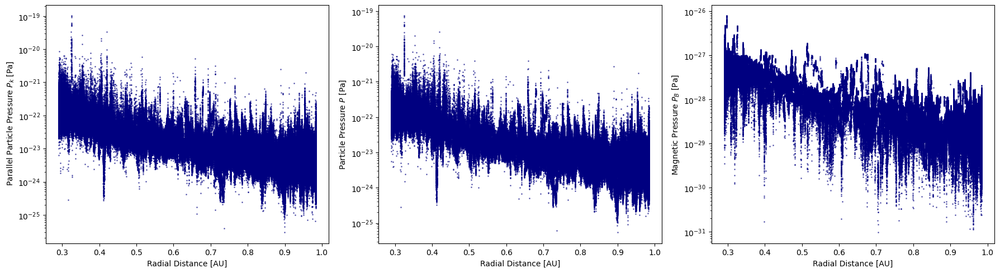

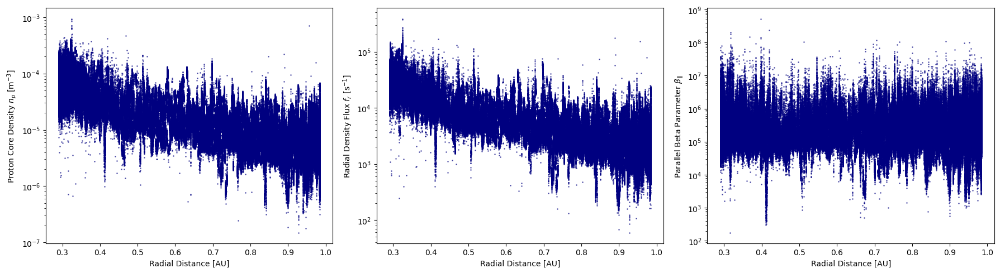

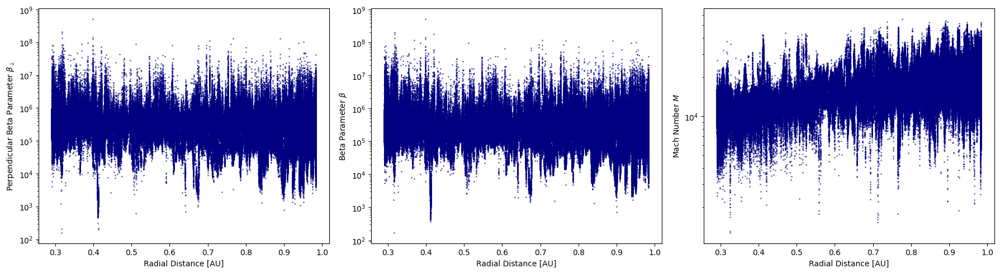

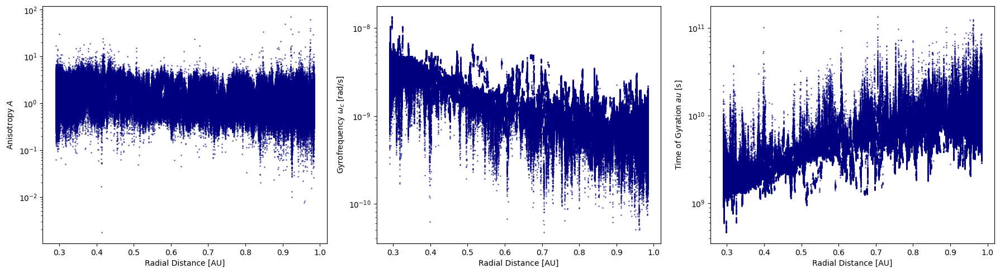

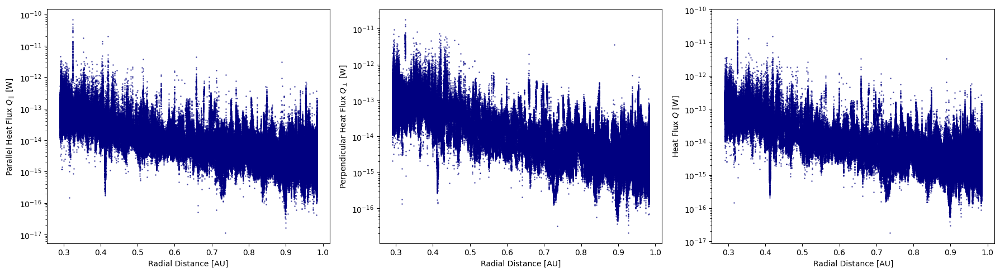

In [ ]:
mpl.rcParams['text.usetex'] = False  # Disable LaTeX rendering if needed

# Combine dictionaries
quantities = {
    **magnetic_field,
    **Temperature,
    **velocity,
    **entropy,
    **pressure,
    **density,
    **other_quantities
}

keys = list(quantities.keys())

# Loop over keys in steps of 3
for i in range(0, len(keys), 3):
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))

    # In case we have fewer than 3 plots left
    for j in range(3):
        if i + j < len(keys):
            key = keys[i + j]
            ylabel, column = quantities[key]

            axs[j].scatter(Helios2['r_sun'], Helios2[column], s=1, alpha=0.5, color='navy')
            axs[j].set_xlabel('Radial Distance [AU]')
            axs[j].set_ylabel(ylabel)
            axs[j].set_yscale('log')
        else:
            axs[j].axis('off')  # Hide unused subplot

    plt.tight_layout()
    plt.show()

## **Moving Average**
Now, we have plotted all the solar wind parameters vs the radial distance, but the data are noisy. One another way to visualize the data is performing  a moving average to our data.

**What is moving average?**

A moving average is a simple way to smooth out noisy data by averaging values over a sliding window.

Instead of plotting every raw data point (which can be scattered and noisy), we take the average of a small group of nearby points and slide that window across the dataset. This helps reveal the underlying trend more clearly.

## 📊 How It Works (Step-by-Step)

Let’s say we have this sequence of solar wind speed measurements vs radial distance:

Raw data: [420, 430, 440, 500, 450, 460, 470, 490, 480]

Using a **moving average window of size 3**, we compute the average of every 3 consecutive points:

- First window: average of \( (420 + 430 + 440)/3 = 430 \)
- Second window: \( (430 + 440 + 500)/3 = 456.7 \)
- Third window: \( (440 + 500 + 450)/3 = 463.3 \)
- ...
- Last window: \( (470 + 490 + 480)/3 = 480 \)

So the **smoothed data** would be:

[430, 456.7, 463.3, 470, 460, 473.3, 480]

This smoothed data is less erratic than the raw values and makes it easier to identify overall trends  
(e.g., is the solar wind generally increasing or decreasing with distance?).


## 🔄 Centered vs Non-Centered Moving Average

Suppose we use a **window of 3** over this data:

Original data (indexed):
Index: [0, 1, 2, 3, 4, 5]
Values: [10, 12, 14, 20, 18, 16]

---

### ✅ With `center = False` (default)

The average is assigned to the **right-most point** in each window:

- Rolling average of [10, 12, 14] → \( (10 + 12 + 14)/3 = 12 \) → assigned to index **2**
- [12, 14, 20] → \( 15.3 \) → index **3**
- [14, 20, 18] → \( 17.3 \) → index **4**
- [20, 18, 16] → \( 18 \) → index **5**

🔁 The plot is **shifted rightward**, since the result is "delayed".

---

### ✅ With `center = True`

The average is assigned to the **center point** of each window:

- [10, 12, 14] → \( 12 \) → assigned to index **1**
- [12, 14, 20] → \( 15.3 \) → index **2**
- [14, 20, 18] → \( 17.3 \) → index **3**
- [20, 18, 16] → \( 18 \) → index **4**

📌 This keeps the **smoothed values aligned** with the **central points**, preserving better alignment with features in your original data (like peaks or dips in solar wind).

---

### 📈 Why use `center = True`?

- ✅ Better **visual alignment** with features like radial distance bins.  
- ✅ More **physically accurate** when looking for **symmetry** in profiles.  
- ✅ Preferred in **scientific plotting** for **symmetric smoothing**.


## 🔬 Why Use Moving Average in Space Physics (e.g., Solar Wind Data)?

Solar wind parameters (density, speed, temperature, etc.) often fluctuate due to turbulence, instrument noise, or local transient events.

A **moving average**:

- Highlights the **general behavior** of solar wind with distance from the Sun.
- **Removes short-term noise** to better study long-term trends or radial profiles.
- Makes plots **easier to interpret** and **visually appealing**.

---

## ⚙️ Parameters You Choose

### 🔹 Window size (e.g., 3 points, 5 points, 10 points...)

- **Small window**: more detail, but less smoothing.
- **Large window**: smoother curve, but may oversimplify the trend.

### 🔹 Type of Moving Average:

- **Simple Moving Average (SMA)** – equal weight to each point in the window.
- **Weighted Moving Average (WMA)** – more weight to recent points.
- **Exponential Moving Average (EMA)** – exponentially decreasing weight to older data.


In [ ]:
mpl.rcParams['text.usetex'] = False

keys = list(quantities.keys())

window_size = 3000  # Smoothing window
for i in range(0, len(keys), 3):
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))
    try:
        for j in range(3):
            if i + j < len(keys):
                key = keys[i + j]
                ylabel, col = quantities[key]

                # Step 1: Clean and sort
                df_clean = Helios2[['r_sun', col]].dropna().copy()
                df_clean = df_clean.sort_values('r_sun')

                # Step 2: Apply centered moving average
                smoothed_col = f"{col}_smooth"
                df_clean[smoothed_col] = df_clean[col].rolling(window=window_size, center=True).mean()
                df_clean.dropna(subset=[smoothed_col], inplace=True)

                # Step 3: Plot raw and smoothed data
                axs[j].scatter(df_clean['r_sun'], df_clean[col], s=2, alpha=0.2, color='navy', label='Raw Data')
                axs[j].plot(df_clean['r_sun'], df_clean[smoothed_col], color='orange',
                         label=f'Moving Average (window={window_size})')
                axs[j].set_xlabel('Radial Distance [AU]')
                axs[j].set_ylabel(ylabel)
                axs[j].set_yscale('log')
                axs[j].grid(True)
                axs[j].set_title(f'{col} vs Radial Distance')
                axs[j].legend(loc='best')

            else:
                axs[j].axis('off')  # Hide unused subplot

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error processing a set of 3 plots: {e}")

 ## **Discussion Questions**

1) How does the solar wind parameters change with radial distance?

# **Radial Trends**

## **Introduction**

During the lecture you have derived the radial trends of a spherically expanding solar wind using the MHD model, which are $n \propto R^{-2}$ and $B \propto R^{-2}$. (ADD the OTHER SCALINGS)

Now let's calculate these scalings from the observations.




## **Plotting and Calculation of Radial trends**

You're trying to fit a relationship of the form:

$$
n_p(r) = A \cdot r^{-k}
$$

Where:

- $n_p$: proton number density  
- $r$: radial distance (in AU)  
- $A$: reference value (density at $r = 1$ AU)  
- $k$: power-law exponent (index)

---

To fit this model, take the natural logarithm of both sides:

$$
\ln n_p = \ln A - k \cdot \ln r
$$

This becomes a **linear equation** in log-log space:

$$
y = mx + b
$$

Where:

- $y = \ln n_p$  
- $x = \ln r$  
- $m = -k$: slope is the negative of the power-law index  
- $b = \ln A$: intercept is the log of the reference value

The Python function 'np.polyfit(x, y, deg=1)' fits a polynomial of degree 1 to \( y \) vs. \( x \).

Here:
\begin{align*}
x &= \ln(r) \\
y &= \ln(n_p)
\end{align*}

So the result is:
$$
\ln n_p = a \cdot \ln r + b \quad \Rightarrow \quad n_p = e^{b} \cdot r^{a}
$$

The array 'coeffs' contains:
\begin{align*}
\texttt{coeffs[0]} &= \text{slope } a = -k \\
\texttt{coeffs[1]} &= \text{intercept } b = \ln A
\end{align*}


In [ ]:
# Step 0: Select the relevant columns and drop rows with NaN
df_clean = Helios2[['r_sun', 'n_p']].dropna().copy()

#  Step1: Fit a polynomial (default: linear)
# You can change degree (e.g., deg=2) for nonlinear fit
degree = 1
coeffs = np.polyfit(np.log(df_clean['r_sun']),np.log(df_clean['n_p']), deg=degree)

print('index=',coeffs[0],'\nreference value=', np.exp(coeffs[1]))

index= -2.0749572672823704 
reference value= 4.98871813017207e-06


In [ ]:
R0 = 1.0  # Reference distance [AU]
R = np.linspace(0.3, 1.0, 100)  # Fit domain

keys = list(quantities.keys())  # quantities = {key: ylabel}

for i in range(0, len(keys), 3):
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))

    for j in range(3):
        if i + j >= len(keys):
            axs[j].axis('off')  # Hide unused subplot if keys not multiple of 3
            continue

        key = keys[i + j]
        ylabel, _ = quantities[key]

        df_clean = Helios2[['r_sun', key]].dropna().copy()
        df_clean = df_clean[df_clean[key] > 0]
        df_clean = df_clean.sort_values('r_sun')

        if df_clean.empty:
            print(f"{key}: skipped (no valid data)")
            axs[j].axis('off')
            continue

        # Fit log-log
        log_r = np.log(df_clean['r_sun'])
        log_y = np.log(df_clean[key])
        coeffs = np.polyfit(log_r, log_y, deg=1)
        alpha = coeffs[0]
        A = np.exp(coeffs[1])

        print(f"{key}: power index = {alpha:.3f}, A = {A:.3g} at r = 1 AU")

        y_fit = A * (R / R0)**(alpha)

        # Plot
        axs[j].scatter(df_clean['r_sun'], df_clean[key], s=2, alpha=0.3, color='navy', label='Data')
        axs[j].plot(R, y_fit, color='red', linewidth=4, label=fr'Fit: $y = A \cdot r^{{{alpha:.2f}}}$')
        axs[j].set_xlabel('Radial Distance $r$ [AU]')
        axs[j].set_ylabel(ylabel)
        axs[j].set_yscale('log')
        axs[j].grid(True, which='both', ls='--', alpha=0.3)
        axs[j].legend(loc='best')
        axs[j].set_title(f'{ylabel.split("$")[0].strip()} vs $r$')

    plt.tight_layout()
    plt.show()

## **Discussion**

### Radial Trends: Theory vs Observations

> **Instructions**:  
> For each plasma parameter, write the expected radial trend or theoretical prediction (e.g., from MHD or CGL theory) under **Theory**, and insert your measured or fitted result under **Observations**.

**Assumptions**
- Steady-state $\partial/\partial t = 0$
- Spherical symmetry ( All quantities depends on r).
- Radial flow only $\vec{v} = v_r(r) \hat{r}$.
- Neglect viscosity, resistivity, heat conduction.
- Quasi-neutral, single fluid proton + electron plasma.
- Adiabatic index $\gamma$ (typically $5/3$).

Using These assumptions we deduce the trends from MHD/CGL equations:

1. Density:

$$
\frac{\partial \rho}{\partial t} + \nabla \cdot (nv) = 0 \Rightarrow \frac{1}{r^2} \frac{\partial}{\partial r} (r^2 \rho u_r) = 0 \Rightarrow r^2 \rho = C \Rightarrow \rho \propto r^{-2}
$$

2. Radial Velocity:
$$
\rho \Big(\frac{\partial \vec{v}}{\partial t} + (\vec{v} \cdot \nabla) \vec{v} \Big) = 0 \Rightarrow \rho \frac{\partial}{\partial r} (\frac{1}{2} u^2_r) = 0 \Rightarrow u^2_r = C \Rightarrow u^2_r \propto r^0
$$

3. Radial Magnetic Field:
$$
\nabla \cdot \vec{B} = 0 \Rightarrow \frac{1}{r^2} \frac{\partial}{\partial r} (r^2 B_r) = 0 \Rightarrow B_r \propto r^{-2}
$$

4. Parallel and Perpendicular Pressure:
$$
\frac{d}{dt} \Big( \frac{p_\parallel B^2}{\rho^3} \Big) = 0, \qquad \frac{d}{dt} \Big( \frac{p_\perp}{ B \rho} \Big) = 0
$$

$$
p_\parallel \propto \frac{r^{-6}}{r^{-4}} = r^{-2}, \qquad p_\perp \propto r^{-2} r^{-2} = r^{-4}
$$

5. Parallel and Perpendicular Temperatures
$$
T_\parallel \propto \frac{p_\parallel}{n} = \frac{r^{-2}}{r^{-2}} = r^0
$$
$$
T_\perp \propto \frac{p_\perp}{n} = \frac{r^{-4}}{r^{-2}} = r^{-2}
$$

6. $\beta$-parameter:
$$
\beta_\parallel \propto \frac{p_\parallel}{B^2} = \frac{r^{-4}}{r^{-4}} = r^{0}
$$
$$
\beta_\perp \propto \frac{p_\perp}{B^2} = \frac{r^{-2}}{r^{-4}} = r^{2}
$$

7. Gyrofrequency:
$$
\omega_c \propto B = r^{-2}
$$

8. Anisotropy
$$
A \propto \frac{p_\perp}{p_\parallel} = r^{-2}
$$

9. Fluxes:
$$
\Phi_r = n u_r \propto r^{-2}
$$

$$
Q_\parallel \propto n T_\parallel u_r = r^{-2}, \quad Q_\perp \propto n T_\perp u_r = r^{-4}
$$

Comparing the radial dependence:

### Density
|Plasma Parameter|Theory (MHD/CGL)| Observations (Fitted)|
|---|---|---|
|Proton Density ($n_p$)|$n_p \propto R^{-2}$|$n_p \propto R^{-2.075}$|


### Velocity
|Plasma Parameter|Theory (MHD/CGL)| Observations (Fitted)|
|---|---|---|
|Radial Velocity ($v_r$)|$v_r \propto R^{0}$|$v_r \propto R^{0.005}$|
|x-Alfven Velocity ($v_{A_x}$)|-|$v_{A_x} \propto R^{-0.779}$|
|y-Alfven Velocity ($v_{A_y}$)|-|$v_{A_y} \propto R^{-0.164}$|
|z-Alfven Velocity ($v_{A_z}$)|-|$v_{A_z} \propto R^{-0.199}$|
|Alfven Velocity ($v_{A}$)|$v_{A} \propto R^{-3}$|$v_{A} \propto R^{-0.492}$|
|Parallel Thermal Velocity ($v_{th\parallel}$)|$v_{th\parallel} \propto R^{0.5}$|$v_{th\parallel} \propto R^{-0.412}$|
|Perpendicular Thermal Velocity ($v_{th\perp}$)|$v_{th\perp} \propto R^{-1.00}$|$v_{th\perp} \propto R^{-0.657}$|

### Temperatures
|Plasma Parameter|Theory (MHD/CGL)| Observations (Fitted)|
|---|---|---|
|Parallel Temperature ($T_{\parallel}$) |$T_\parallel \propto R^{0}$|$ T_{\parallel} \propto R^{-0.825}$|
|Perpendicular Temperature ($T_{\perp}$) |$T_\perp \propto R^{-2}$| $ T_{\perp} \propto R^{-1.315}$|
|Total Temperature ($T_p$)|$T_p \propto R^{-2}$|$T_p \propto R^{-1.031}$|


### Magnetic field
|Plasma Parameter|Theory (MHD/CGL)| Observations (Fitted)|
|---|---|---|
|Magnetic Field Magnitude ($|B|$) |$B \propto R^{-2}$ |$ B \propto R^{-1.530}$|
|Radial Magnetic Field ($B_r$)|$ B_r \propto R^{-2}$|$ B_r \propto R^{-1.873}$|
|Tangential Magnetic Field ($B_t$)|$ B_t \propto R^{0}$|$ B_t \propto R^{-1.214}$|

### Entropy
|Plasma Parameter|Theory (MHD/CGL)| Observations (Fitted)|
|---|---|---|
|Perpendicular Entropy ($S_\perp$)|$S_\perp \propto R^{-0.667}$|$S_\perp \propto R^{0.004}$|
| Parallel Entropy ($S_\parallel$)|$ S_\parallel \propto R^{1.333}$|$ S_\parallel \propto R^{0.030}$|
|Entropy ($S_\parallel$)|$ S \propto R^{-0.667}$|$ S \propto R^{0.019}$|

### Particle Pressure
|Plasma Parameter|Theory (MHD/CGL)| Observations (Fitted)|
|---|---|---|
|Parallel Particle Pressure ($P_{k\parallel}$)|$ P_\parallel \propto R^{-2}$|$ P_\parallel \propto R^{-2.900}$|
|Perpendicular Particle Pressure ($P_{k\perp}$)|$ P_\perp \propto R^{-4}$|$ P_\perp \propto R^{-3.390}$|
|Particle Pressure ($P_k$)|-|$ P_k \propto R^{-3.106}$|

### Magnetic Pressure
|Plasma Parameter|Theory (MHD/CGL)| Observations (Fitted)|
|---|---|---|
|Magnetic Pressure ($P_B$)|$ P_B \propto R^{-3.333}$| $ P_B \propto R^{-3.060}$|

### Beta Parameter
|Plasma Parameter|Theory (MHD/CGL)| Observations (Fitted)|
|---|---|---|
|Beta Parallel Parameter ($\beta_\parallel$)|$\beta_\parallel \propto R^{2}$|$\beta_\parallel \propto R^{0.160}$|
|Beta Perpendicular Parameter ($\beta_\perp$)|$\beta_\perp \propto R^{0}$|$\beta_\perp \propto R^{-0.330}$|
|Beta Parameter ($\beta$)|-|$\beta \propto R^{-0.046}$|

### Heating Rate
|Plasma Parameter|Theory (MHD/CGL)| Observations (Fitted)|
|---|---|---|
| Perpendicular Heating Rate ($Q_\perp$)|$Q_\perp \propto R^{-4}$|$Q_\perp \propto R^{-3.400}$|
| Parallel Heating Rate ($Q_\parallel$)|$Q_\parallel \propto R^{-2}$|$Q_\parallel \propto R^{-2.910}$|
|Heating Rate ($Q$)|-|$Q \propto R^{-3.116}$|

### Other Parameters
|Plasma Parameter|Theory (MHD/CGL)| Observations (Fitted)|
|---|---|---|
| Gyrofrequency ($\omega_c$)|$ \omega_c\propto R^{-2}$|$\omega_c \propto R^{-1.530}$|
|Anisotropy (A)|$A \propto R^{-2}$|$A \propto R^{-0.490}$|
|Radial Density Flux ($\Phi_r$)|$\Phi_r \propto R^{-2}$|$\Phi_r \propto R^{-2.085}$|
|Mach Number ($M$)|$M \propto R^{0}$|$M \propto R^{0.505}$|

## **Parker Spiral**

The solar wind is a continuous outflow of charged particles (primarily electrons, protons, and alpha particles) from the Sun's outer atmosphere (the corona). This ionized gas, or plasma, escapes the Sun's gravitational pull due to its high thermal energy and the dynamic interaction with the solar magnetic field.

Eugene Parker, in 1958, formalized this idea by modeling the solar atmosphere as a spherically symmetric, isothermally expanding fluid. Initially neglecting magnetic effects, Parker showed that this expanding plasma naturally accelerates and becomes supersonic beyond a certain critical radius.

## Solar Wind Velocity Profile
Under the conditions of isothermal expansion ($\gamma = 1$) of neutral fluid, it leads to a non-linear first-order differential equation that relates the solar wind speed ($u(r)$) and the heliocentric distance ($r$).

$$
\frac{du(r)}{dr} = \left( \frac{4kT}{mr} - \frac{GM}{r^2} \right) u(r) \left( u(r)^2 - \frac{2kT}{m} \right)^{-1}
$$

where:

$$
R=\frac{r}{r_c} \text{Radius at sonic radii} \quad r_c = \frac{GM}{2c_s^2}
$$
$$
v=\frac{u}{c_s}, \quad \text{Speed at sonic velocities} \quad c_s^2 = \frac{2kT}{m}
$$

$$
\frac{dv}{dR}=\frac{2(1/R - 1/R^2)}{v-1/v}
$$

In [ ]:
v = Function('v')  # Define velocity as a function v(R)
R = symbols('R')   # Radial distance from Sun, in adimensional units

eq_ord = Eq(v(R).diff(R), 2*(1/R - 1/R**2)/(v(R) - 1/v(R)))  # Parker's adimensional equation

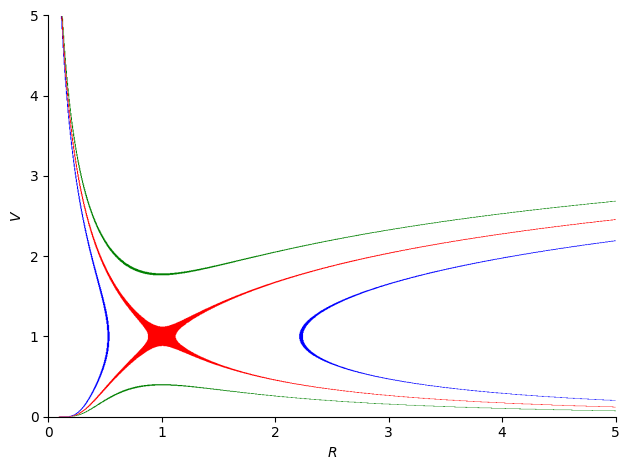

In [ ]:
sol = dsolve(eq_ord, hint='separable', simplify=False)
solve(sol.subs({v(R): 1, R: 1}))

V = symbols('V')

p1 = plot_implicit(sol.subs({'C1': -1, v(R): V}),(R, 0, 5),(V, 0, 5),line_color='green',show=False)
p2 = plot_implicit(sol.subs({'C1': -2, v(R): V}),(R, 0, 5),(V, 0, 5),line_color='blue',show=False)
p3 = plot_implicit(sol.subs({'C1': -1.5, v(R): V}),(R, 0, 5),(V, 0, 5),line_color='red',show=False)

p1.extend([p2[0], p3[0]])  # append curve plots to same axes
p1.show()


**The Blue Solution:** The rightmost blue curve does not start on the surface of the Sun, while the leftmost blue curve makes no physical sense since it would escape from the Sun with a subsonic velocity and return with a supersonic velocity.

**The Green Curves:** Solutions that do not pass through the critical point and therefore are not physically acceptable. Additionally, the upper starts with a supersonic velocity near the Sun, which has not been observed, while the lower leads to constant pressure in the interstellar medium, which makes no physical sense.

**The Red Curve:** leads to an increase in velocity after the critical point, which is observed, but also leads to zero pressure in the interstellar medium.

## Studying the Anisotropy

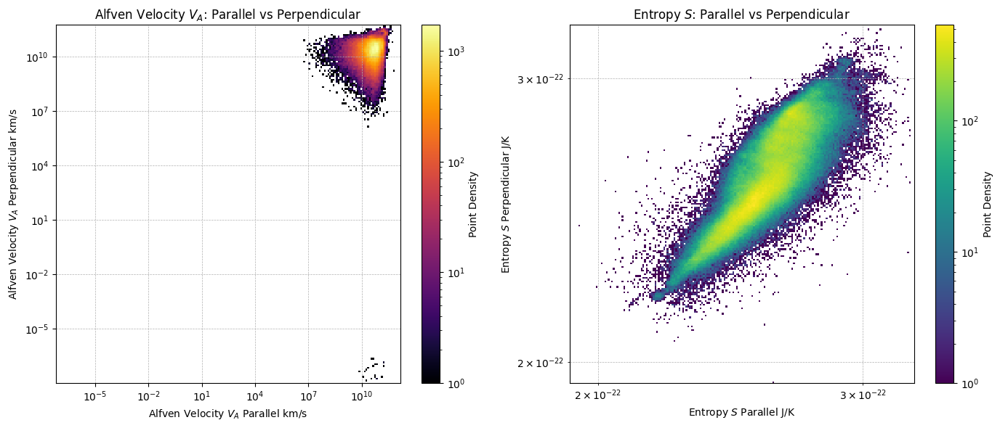

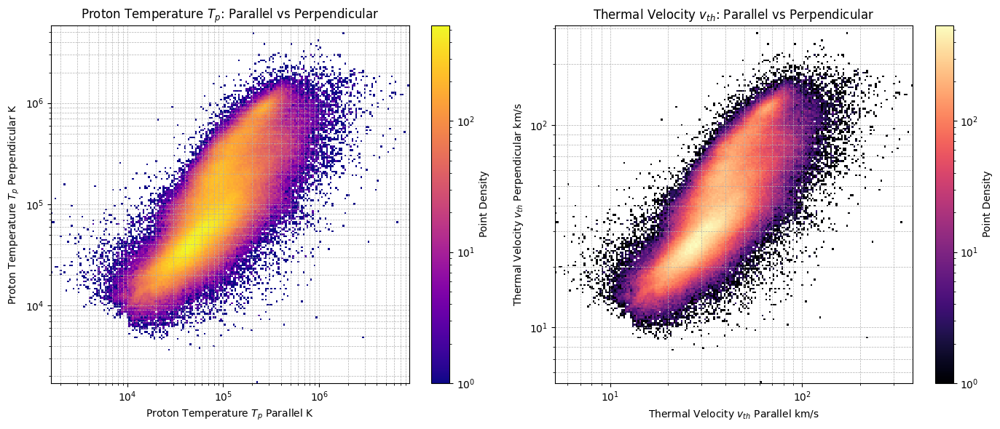

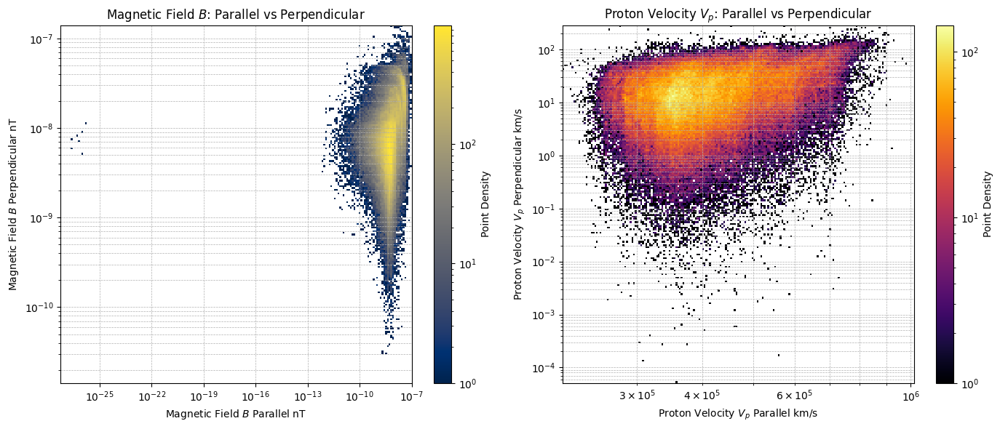

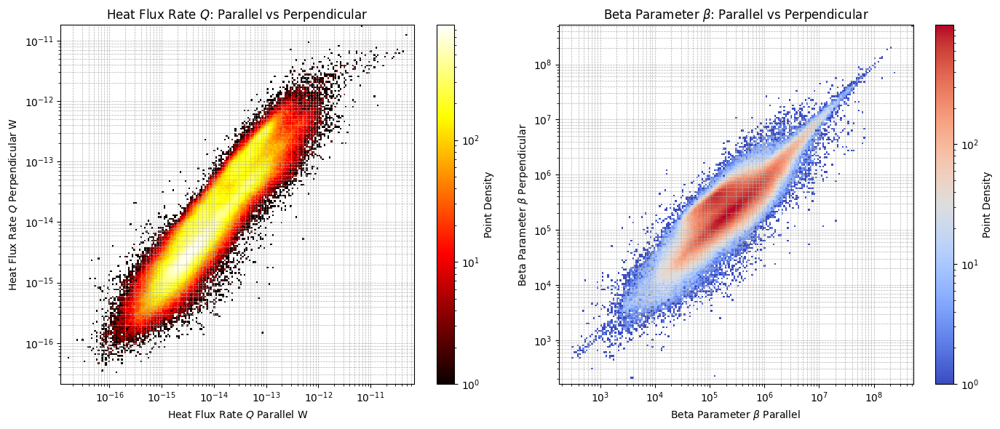

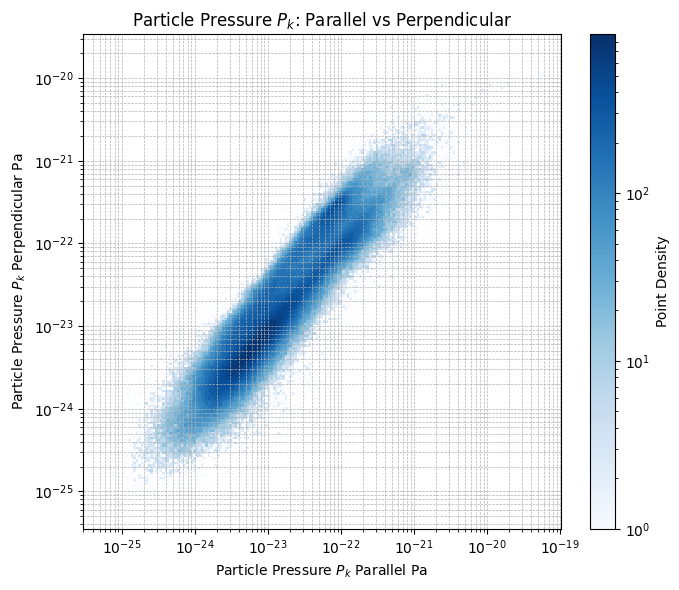

In [ ]:
import matplotlib.colors

# List of quantities to plot in pairs (parallel vs perpendicular)
plot_pairs = [
    (Helios2['v_Ax'],  Helios2['v_Az'], r'Alfven Velocity $V_{A}$', 'km/s', 'inferno'),
    (Helios2['S_par'], Helios2['S_perp'], r'Entropy $S$', r'J/K', 'viridis'),
    (Helios2['Tp_par'], Helios2['Tp_perp'], r'Proton Temperature $T_p$', 'K', 'plasma'),
    (Helios2['vth_p_par'], Helios2['vth_p_perp'], r'Thermal Velocity $v_{th}$', 'km/s', 'magma'),
    (Helios2['B_r'], Helios2['B_tan'], r'Magnetic Field $B$', 'nT', 'cividis'),
    (Helios2['V_r'],  Helios2['vp_z'], r'Proton Velocity $V_p$', 'km/s', 'inferno'),
    (Helios2['Q_par'], Helios2['Q_perp'], r'Heat Flux Rate $Q$', 'W', 'hot'),
    (Helios2['beta_par'], Helios2['beta_perp'], r'Beta Parameter $\beta$', '', 'coolwarm'),
    (Helios2['P_k_par'], Helios2['P_k_perp'], r'Particle Pressure $P_k$', 'Pa', 'Blues'),
]

for i in range(0, len(plot_pairs), 2):
    # If 2 plots remain → make 2 axes, else just 1
    if i + 1 < len(plot_pairs):
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))
        axes = np.atleast_1d(axes)  # ensure iterable
        ncols = 2
    else:
        fig, ax = plt.subplots(1, 1, figsize=(7, 6))
        axes = [ax]
        ncols = 1

    for j in range(ncols):
        x_data, y_data, quantity_name, unit, cmap_name = plot_pairs[i + j]

        # Filter positive values for log-log
        mask = (x_data > 0) & (y_data > 0)
        if mask.sum() == 0:
            print(f"Skipping {quantity_name}, no positive values.")
            continue

        x_positive = x_data[mask]
        y_positive = y_data[mask]

        x_bins = np.logspace(np.log10(x_positive.min()), np.log10(x_positive.max()), 200)
        y_bins = np.logspace(np.log10(y_positive.min()), np.log10(y_positive.max()), 200)

        ax = axes[j]
        h = ax.hist2d(x_positive, y_positive, bins=[x_bins, y_bins],
                      cmap=cmap_name, norm=matplotlib.colors.LogNorm())

        ax.set_xscale('log')
        ax.set_yscale('log')
        ax.set_xlabel(f'{quantity_name} Parallel {unit}')
        ax.set_ylabel(f'{quantity_name} Perpendicular {unit}')
        ax.set_title(f'{quantity_name}: Parallel vs Perpendicular')
        cb = fig.colorbar(h[3], ax=ax)
        cb.set_label('Point Density')
        ax.grid(True, which="both", ls="--", lw=0.5)

    plt.tight_layout()
    plt.show()


## Density Distribution

We see how density distribute with each quantity.

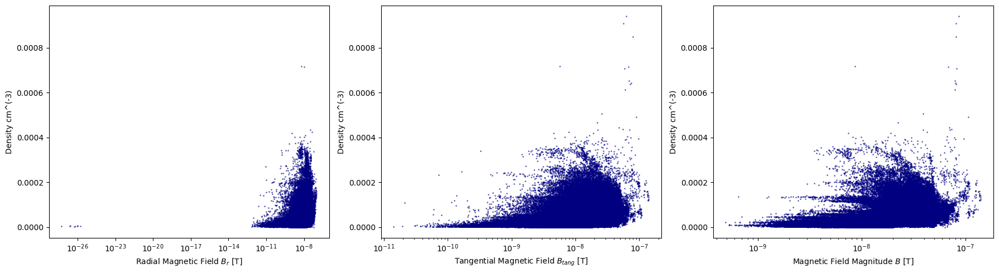

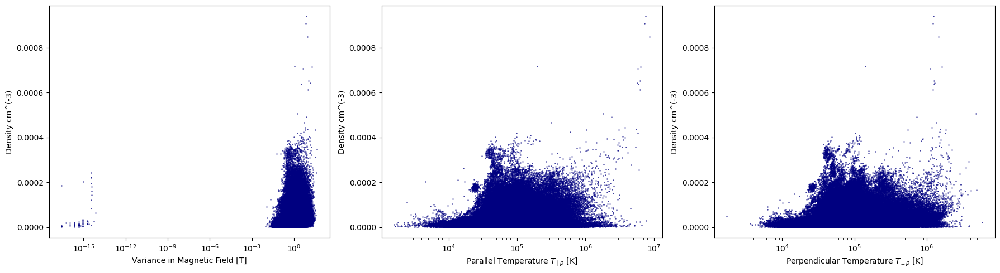

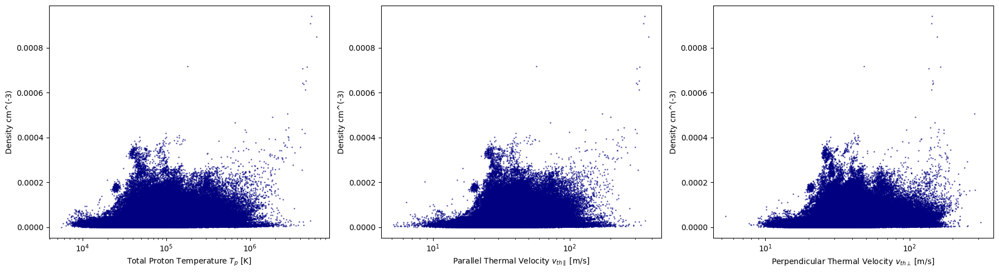

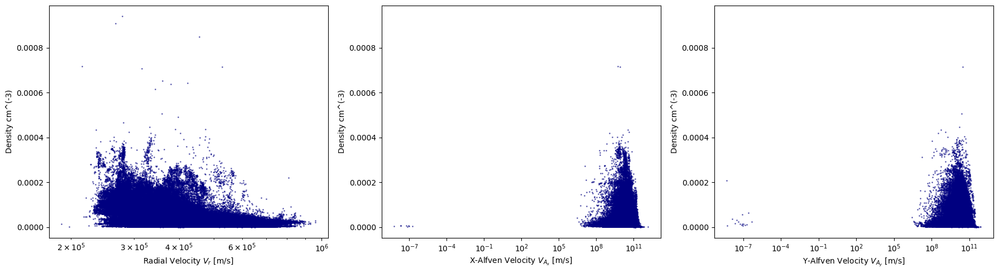

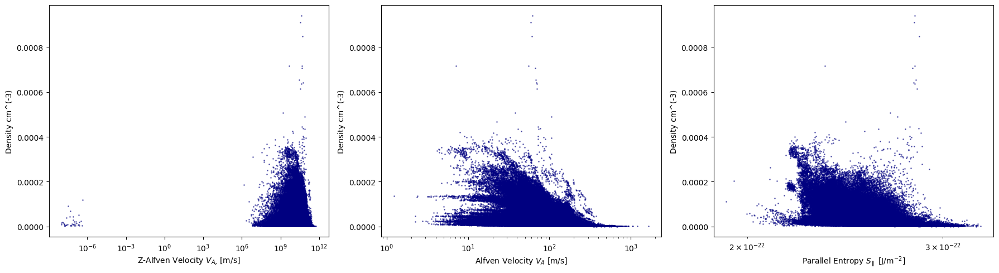

...

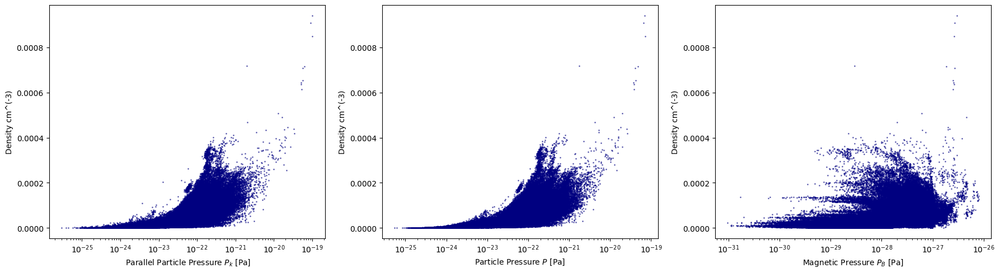

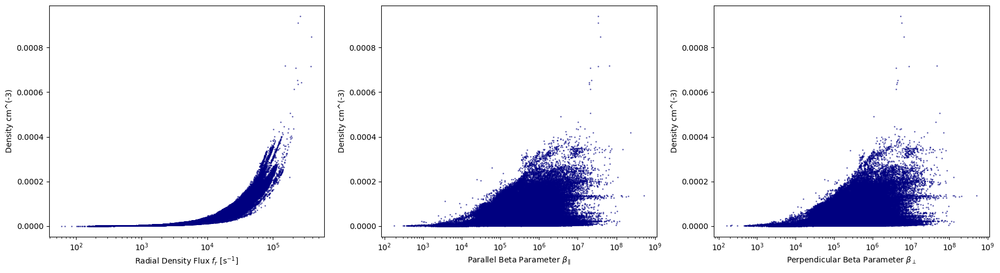

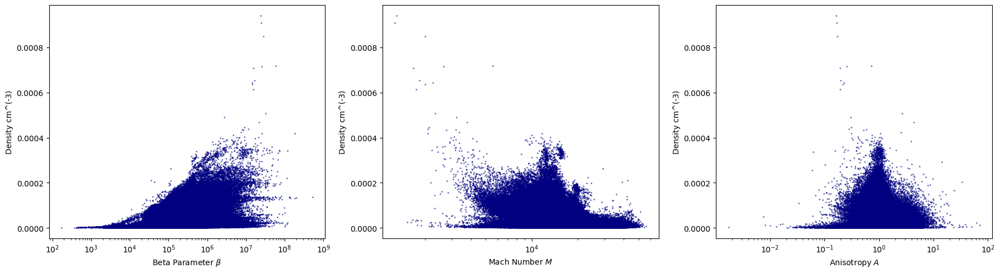

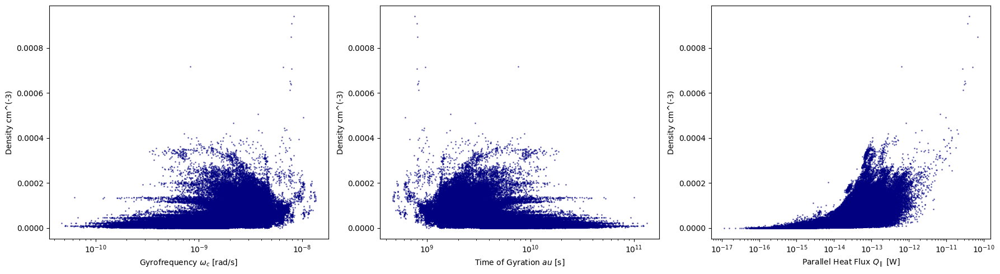

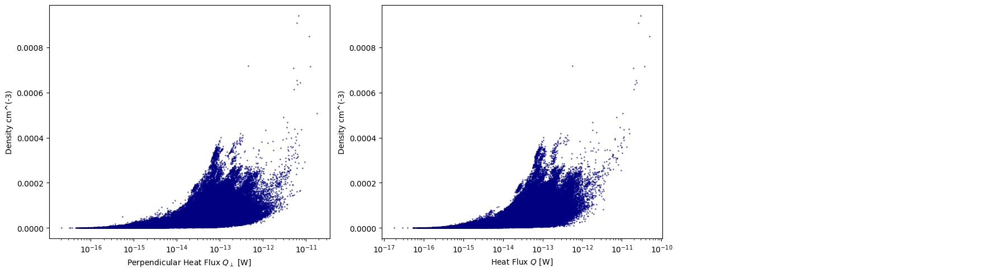

In [ ]:
mpl.rcParams['text.usetex'] = False  # Disable LaTeX rendering if needed

# Combine dictionaries
quantities = {
    **magnetic_field,
    **Temperature,
    **velocity,
    **entropy,
    **pressure,
    **other_quantities
}

keys = list(quantities.keys())

# Loop over keys in steps of 3
for i in range(0, len(keys), 3):
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))

    # In case we have fewer than 3 plots left
    for j in range(3):
        if i + j < len(keys):
            key = keys[i + j]
            xlabel, column = quantities[key]

            axs[j].scatter(Helios2[column], Helios2['n_p'], s=1, alpha=0.5, color='navy')
            axs[j].set_ylabel('Density cm^(-3)')
            axs[j].set_xlabel(xlabel)
            axs[j].set_xscale('log')
        else:
            axs[j].axis('off')  # Hide unused subplot

    plt.tight_layout()
    plt.show()

In [ ]:
mpl.rcParams['text.usetex'] = False  # Disable LaTeX rendering if needed

n0 = 1.0  # Reference scaling
keys = list(quantities.keys())  # quantities = {key: ylabel}

for i in range(0, len(keys), 3):
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))

    for j in range(3):
        if i + j >= len(keys):
            axs[j].axis('off')
            continue

        key = keys[i + j]
        xlabel, _ = quantities[key]

        # Clean data
        df_clean = Helios2[[key, 'n_p']].dropna().copy()
        df_clean = df_clean[(df_clean[key] > 0) & (df_clean['n_p'] > 0)]
        df_clean = df_clean.sort_values(key)

        if df_clean.empty:
            print(f"{key}: skipped (no valid data)")
            axs[j].axis('off')
            continue

        # Fit log-log: log(n_p) vs log(key)
        log_x = np.log(df_clean[key])
        log_y = np.log(df_clean['n_p'])
        coeffs = np.polyfit(log_x, log_y, deg=1)
        alpha, logA = coeffs
        A = np.exp(logA)

        print(f"{key}: n_p ~ {A:.3g} * {key}^{alpha:.3f}")

        # Fit curve for plotting
        x_fit = np.linspace(df_clean[key].min(), df_clean[key].max(), 200)
        y_fit = A * (x_fit / n0) ** alpha

        # Plot data + fit
        axs[j].scatter(df_clean[key], df_clean['n_p'], s=5, alpha=0.4,
                       color='navy', label='Data')
        axs[j].plot(x_fit, y_fit, color='red', linewidth=2,
                    label='Fitted Power Law') # Simplified legend label

        axs[j].set_xlabel(xlabel)
        axs[j].set_ylabel(r'Density $n_p$ [cm$^{-3}$]')
        axs[j].set_xscale('log')
        axs[j].set_yscale('log')
        axs[j].grid(True, which='both', ls='--', alpha=0.3)
        axs[j].legend()
        axs[j].set_title(f'$n_p$ vs {xlabel}')

    plt.tight_layout()
    plt.show()

## Density Trends

This is how proton's density $n_p$ change with each quantity:

### Velocity
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Radial Velocity ($v_r$)|$n_p \propto V_r^{-1.550}$|
|Alfven Velocity ($v_{A}$)|$n_p \propto v_A^{-0.225}$|
|Parallel Thermal Velocity ($v_{th\parallel}$)|$n_p \propto v_{th\parallel}^{0.626}$|
|Perpendicular Thermal Velocity ($v_{th\perp}$)|$n_p \propto v_{th\perp}^{0.406}$|

### Temperatures
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Parallel Temperature ($T_{\parallel}$) |$n_p \propto T_{\parallel}^{0.31}$|
|Perpendicular Temperature ($T_{\perp}$) |$n_p \propto T_{\perp}^{0.20}$|
|Total Temperature ($T_p$)|$n_p \propto T_p^{0.273}$|


### Magnetic field
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Magnetic Field Magnitude ($|B|$) |$n_p \propto B^{0.944}$|
|Radial Magnetic Field ($B_r$)|$n_p \propto B_r^{0.395}$|
|Tangential Magnetic Field ($B_t$)|$n_p \propto B_t^{0.656}$|

### Entropy
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Perpendicular Entropy ($S_\perp$)|$n_p \propto S_\perp^{-8.164}$|
| Parallel Entropy ($S_\parallel$)|$n_p \propto S_\parallel^{-12.787}$|
|Entropy ($S$)|$n_p \propto S^{-11.221}$|

### Particle Pressure
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Parallel Particle Pressure ($P_{k\parallel}$)|$n_p \propto P_{k\parallel}^{0.633}$|
|Perpendicular Particle Pressure ($P_{k\perp}$)|$n_p \propto P_{k\perp}^{0.515}$|
|Particle Pressure ($P_k$)|$n_p \propto P_k^{0.598}$|

### Magnetic Pressure
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Magnetic Pressure ($P_B$)|$n_p \propto P_B^{0.472}$|

### Beta Parameter
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Beta Parallel Parameter ($\beta_\parallel$)|$n_p \propto \beta_\parallel^{0.249}$|
|Beta Perpendicular Parameter ($\beta_\perp$)|$n_p \propto \beta_\perp^{0.312}$|
|Beta Parameter ($\beta$)|$n_p \propto \beta^{0.290}$|

### Heating Rate
|Plasma Parameter|Observations (Fitted)|
|---|---|
| Perpendicular Heating Rate ($Q_\perp$)|$n_p \propto Q_\perp^{0.457}$|
| Parallel Heating Rate ($Q_\parallel$)|$n_p \propto Q_\parallel^{0.581}$|
|Heating Rate ($Q$)|$n_p \propto Q^{0.538}$|

### Other Parameters
|Plasma Parameter|Observations (Fitted)|
|---|---|
| Gyrofrequency ($\omega_c$)|$n_p \propto \omega_c^{0.944}$|
|Anisotropy (A)|$n_p \propto A^{0.088}$|
|Radial Density Flux ($\Phi_r$)|$n_p \propto \Phi_r^{1.024}$|
|Mach Number ($M$)|$n_p \propto M^{-1.443}$|

## Time Fluctuations

This section shows how quantities fluctuate with time.

In [ ]:
mpl.rcParams['text.usetex'] = False  # Disable LaTeX rendering if needed

# --- Convert 'Time' column to datetime ---
# Correct the format string to match the actual date format
Helios2['Time'] = pd.to_datetime(Helios2['Time'], format='%Y-%m-%d %H:%M:%S')

# Combine dictionaries
quantities = {
    **magnetic_field,
    **Temperature,
    **velocity,
    **entropy,
    **pressure,
    **density,
    **other_quantities
}

keys = list(quantities.keys())

window_size = 3000  # Smoothing window
for i in range(0, len(keys), 3):
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))
    try:
        for j in range(3):
            if i + j < len(keys):
                key = keys[i + j]
                ylabel, col = quantities[key]

                # Step 1: Clean and sort
                df_clean = Helios2[['Time', col]].dropna().copy()
                df_clean = df_clean.sort_values('Time')

                # Step 2: Apply centered moving average
                smoothed_col = f"{col}_smooth"
                df_clean[smoothed_col] = df_clean[col].rolling(window=window_size, center=True).mean()
                df_clean.dropna(subset=[smoothed_col], inplace=True)

                # Step 3: Plot raw and smoothed data
                axs[j].scatter(df_clean['Time'], df_clean[col], s=2, alpha=0.2, color='navy', label='Raw Data')
                axs[j].plot(df_clean['Time'], df_clean[smoothed_col], color='orange',
                         label=f'Moving Average (window={window_size})')
                axs[j].set_xlabel('Time')
                axs[j].set_ylabel(ylabel)
                axs[j].set_yscale('log')
                axs[j].grid(True)
                axs[j].set_title(f'{col} vs Radial Distance')
                axs[j].legend(loc='best')

            else:
                axs[j].axis('off')  # Hide unused subplot

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error processing a set of 3 plots: {e}")

## Time Trends

We see how quantities change with time.

In [ ]:
mpl.rcParams['text.usetex'] = False

Helios2['Time'] = pd.to_datetime(Helios2['Time'], format='%Y-%m-%d %H:%M:%S')
t_numeric = (Helios2['Time'] - Helios2['Time'].min()).dt.total_seconds()

n0 = 1.0
keys = list(quantities.keys())  # quantities = {key: (ylabel, col)}

for i in range(0, len(keys), 3):
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))

    for j in range(3):
        if i + j >= len(keys):
            axs[j].axis('off')
            continue

        key = keys[i + j]
        ylabel, col = quantities[key]

        # Clean data
        df_clean = Helios2[['Time', col]].dropna().copy()
        df_clean = df_clean[df_clean[col] > 0]
        if df_clean.empty:
            print(f"{col}: skipped (no valid data)")
            axs[j].axis('off')
            continue

        # Numeric time axis
        t_num = (df_clean['Time'] - df_clean['Time'].min()).dt.total_seconds()
        y_vals = df_clean[col].values

        # Log-log fit: log(y) vs log(t)
        log_t = np.log(t_num + 1e-9)  # avoid log(0)
        log_y = np.log(y_vals)
        coeffs = np.polyfit(log_t, log_y, deg=1)
        alpha, logA = coeffs
        A = np.exp(logA)

        print(f"{col}: y(t) ~ {A:.3g} * t^{alpha:.3f}")

        # Fit curve
        t_fit = np.linspace(t_num.min(), t_num.max(), 200)
        y_fit = A * (t_fit / n0) ** alpha
        time_fit = pd.to_datetime(t_fit + df_clean['Time'].min().value/1e9, unit="s")

        # Plot
        axs[j].scatter(df_clean['Time'], y_vals, s=5, alpha=0.4,
                       color='navy', label='Data')
        axs[j].plot(time_fit, y_fit, color='red', linewidth=2,
                    label=fr'Fit: $y = {A:.2g}\,t^{{{alpha:.2f}}}$')

        axs[j].set_xlabel('Time')
        axs[j].set_ylabel(ylabel)
        axs[j].set_yscale('log')
        axs[j].set_xscale('log')  # log scale for time too
        axs[j].grid(True, which='both', ls='--', alpha=0.3)
        axs[j].legend()
        axs[j].set_title(f'{ylabel} vs Time')

    plt.tight_layout()
    plt.show()


This is how each quantity change with time:

### Density
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Density ($n_p$)|$n_p \propto t^{-0.28}$|

### Velocity
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Radial Velocity ($v_r$)|$V_r \propto t^{-0.05}$|
|Alfven Velocity ($v_{A}$)|$v_A \propto t^{-0.03}$|
|Parallel Thermal Velocity ($v_{th\parallel}$)|$v_{th\parallel} \propto t^{-0.09}$|
|Perpendicular Thermal Velocity ($v_{th\perp}$)|$v_{th\perp} \propto t^{-0.13}$|

### Temperatures
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Parallel Temperature ($T_{\parallel}$) |$T_{\parallel} \propto t^{-0.19}$|
|Perpendicular Temperature ($T_{\perp}$) |$T_{\perp} \propto t^{-0.27}$|
|Total Temperature ($T_p$)|$T_p \propto t^{-0.22}$|


### Magnetic field
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Magnetic Field Magnitude ($|B|$) |$B \propto t^{-0.17}$|
|Radial Magnetic Field ($B_r$)|$B_r \propto t^{-0.19}$|
|Tangential Magnetic Field ($B_t$)|$B_t \propto t^{-0.10}$|

### Entropy
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Perpendicular Entropy ($S_\perp$)|$S_{\perp} \propto t^{0}$|
| Parallel Entropy ($S_\parallel$)|$S_{\parallel} \propto t^{0}$|
|Entropy ($S$)|$S \propto t^{0}$|

### Particle Pressure
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Parallel Particle Pressure ($P_{k\parallel}$)|$P_{k\parallel} \propto t^{-0.47}$|
|Perpendicular Particle Pressure ($P_{k\perp}$)|$P_{k\perp} \propto t^{-0.55}$|
|Particle Pressure ($P_k$)|$P_k \propto t^{-0.50}$|

### Magnetic Pressure
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Magnetic Pressure ($P_B$)|$P_B \propto t^{-0.35}$|

### Beta Parameter
|Plasma Parameter|Observations (Fitted)|
|---|---|
|Beta Parallel Parameter ($\beta_\parallel$)|$\beta_{\parallel} \propto t^{-0.12}$|
|Beta Perpendicular Parameter ($\beta_\perp$)|$\beta_{\perp} \propto t^{-0.20}$|
|Beta Parameter ($\beta$)|$\beta \propto t^{-0.16}$|

### Heating Rate
|Plasma Parameter|Observations (Fitted)|
|---|---|
| Perpendicular Heating Rate ($Q_\perp$)|$Q_{\perp} \propto t^{-0.59}$|
| Parallel Heating Rate ($Q_\parallel$)|$Q_{\parallel} \propto t^{-0.51}$|
|Heating Rate ($Q$)|$Q \propto t^{-0.55}$|

### Other Parameters
|Plasma Parameter|Observations (Fitted)|
|---|---|
| Gyrofrequency ($\omega_c$)|$\omega_c \propto t^{-0.17}$|
|Anisotropy (A)|$A \propto t^{-0.08}$|
|Radial Density Flux ($\Phi_r$)|$\Phi_r \propto t^{-0.32}$|
|Mach Number ($M$)|$M \propto t^{0.07}|

We here scatter, as a heat map, each quantity with respect to $n_p$ and $V_r$.

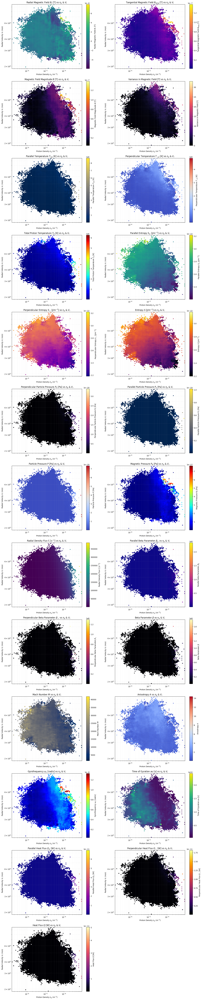

In [ ]:
from matplotlib import cm
from scipy.stats import binned_statistic_2d

n_p = Helios2['n_p']
V_r = Helios2['V_r']

quantities = {
    **magnetic_field,
    **Temperature,
    **entropy,
    **pressure,
    **other_quantities
}

keys = list(quantities.keys())

n_plots = len(quantities)
n_cols = 2
n_rows = (n_plots + 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 6 * n_rows))
axes = axes.flatten()

cmaps = ['viridis', 'plasma', 'inferno', 'magma', 'cividis', 'coolwarm', 'jet']

for idx, (quantity_name, (ylabel, col)) in enumerate(quantities.items()):
    ax = axes[idx]

    z_data = Helios2[col]
    valid_mask = (n_p > 0) & (V_r > 0) & (~np.isnan(z_data))
    x_valid = n_p[valid_mask]
    y_valid = V_r[valid_mask]
    z_valid = z_data[valid_mask]

    if len(x_valid) == 0:
        print(f"Skipping {quantity_name}, no valid data.")
        continue

    x_bins = np.logspace(np.log10(np.min(x_valid)), np.log10(np.max(x_valid)), 100)
    y_bins = np.logspace(np.log10(np.min(y_valid)), np.log10(np.max(y_valid)), 100)

    stat, x_edges, y_edges, binnumber = binned_statistic_2d(
        x_valid, y_valid, z_valid,
        statistic='mean', bins=[x_bins, y_bins]
    )

    mesh = ax.pcolormesh(x_edges, y_edges, stat.T, cmap=cmaps[idx % len(cmaps)],
                         shading='auto')

    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel('Proton Density $n_p$ (m$^{-3}$)')
    ax.set_ylabel('Radial Velocity $V_r$ (m/s)')
    ax.set_title(f'{ylabel} vs $n_p$ & $V_r$')

    cb = fig.colorbar(mesh, ax=ax)
    cb.set_label(ylabel)

    ax.grid(True, which="both", ls="--", lw=0.5, alpha=0.3)

# Hide unused subplots
for idx in range(len(quantities), len(axes)):
    axes[idx].set_visible(False)

plt.tight_layout()
plt.show()


## **Regions of Solar Wind Velocity**

Now, we plot the radial velocity with each quantity. We also mark the slow, intermediate, and fast regions of solar wind.

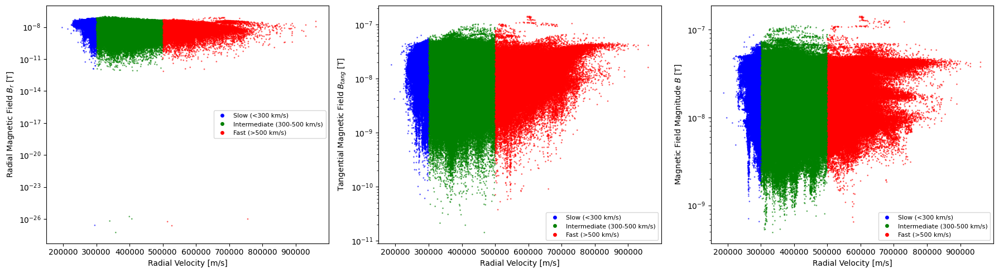

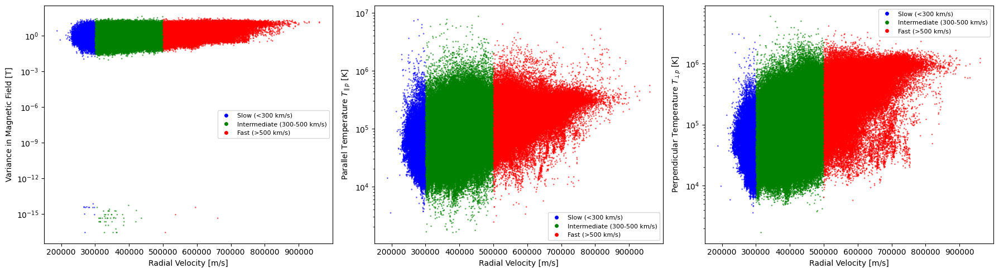

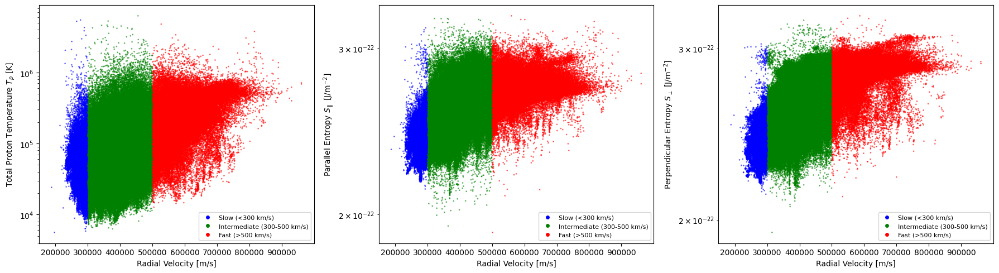

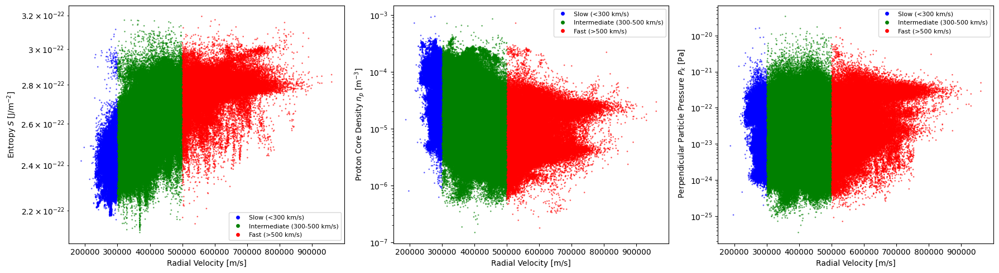

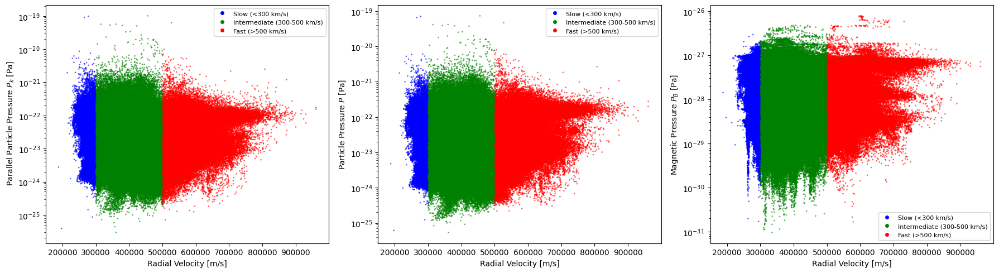

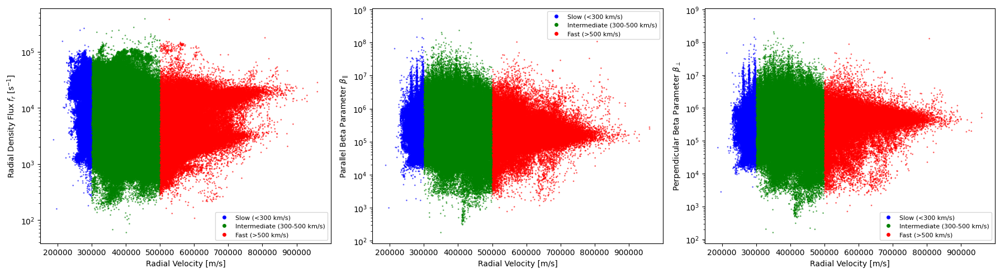

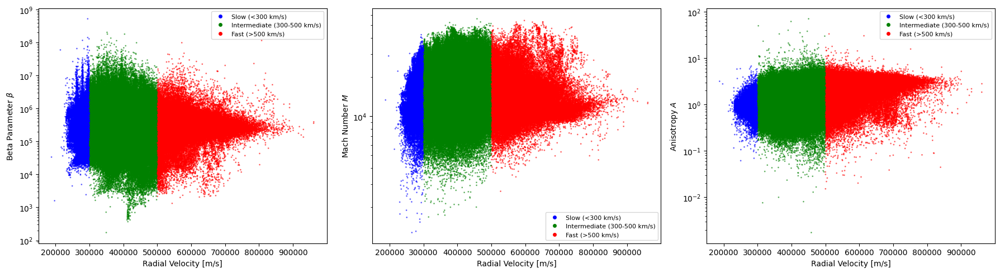

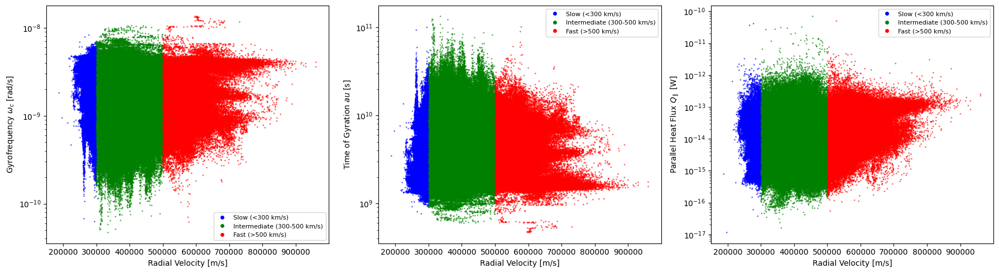

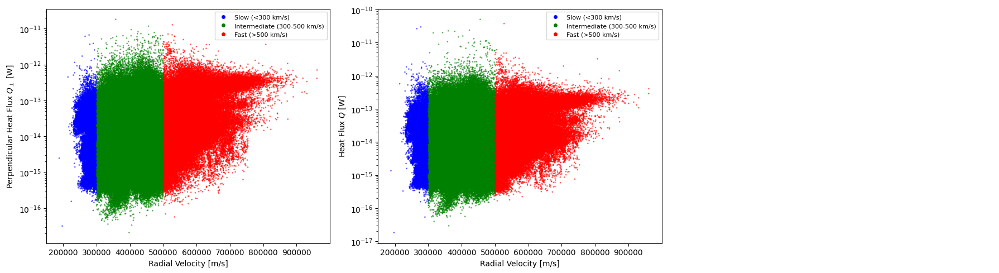

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

mpl.rcParams['text.usetex'] = False  # Disable LaTeX rendering if needed

# Combine dictionaries
quantities = {
    **magnetic_field,
    **Temperature,
    **entropy,
    **density,
    **pressure,
    **other_quantities
}

keys = list(quantities.keys())

# Define velocity bins and colors
def get_color(v):
    if v < 300e3:
        return "blue"         # slow
    elif 300e3 <= v <= 500e3:
        return "green"        # intermediate
    else:
        return "red"          # fast

colors = Helios2['V_r'].apply(get_color)  # map colors

# Loop over keys in steps of 3
for i in range(0, len(keys), 3):
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))

    # In case we have fewer than 3 plots left
    for j in range(3):
        if i + j < len(keys):
            key = keys[i + j]
            ylabel, column = quantities[key]

            axs[j].scatter(
                Helios2['V_r'],
                Helios2[column],
                s=1, alpha=0.5, c=colors
            )
            axs[j].set_xlabel('Radial Velocity [m/s]')
            axs[j].set_ylabel(ylabel)
            axs[j].set_yscale('log')

            # Add legend manually
            from matplotlib.lines import Line2D
            legend_elements = [
                Line2D([0], [0], marker='o', color='w', label='Slow (<300 km/s)',
                       markerfacecolor='blue', markersize=6),
                Line2D([0], [0], marker='o', color='w', label='Intermediate (300-500 km/s)',
                       markerfacecolor='green', markersize=6),
                Line2D([0], [0], marker='o', color='w', label='Fast (>500 km/s)',
                       markerfacecolor='red', markersize=6)
            ]
            axs[j].legend(handles=legend_elements, loc="best", fontsize=8)
        else:
            axs[j].axis('off')  # Hide unused subplot

    plt.tight_layout()
    plt.show()


## **Anisotropy-$\beta_\parallel$ Plot**

We scatter solar wind data in $(\beta_\parallel, A)$ space, where

$$A = \frac{T_\perp}{T_\parallel}, \qquad \beta_\parallel = \frac{n k_B T_\parallel}{B^2/(2\mu_0)}$$


$$
\text{The x-axis } \beta:
\begin{cases}
\beta \ll 1  &\Rightarrow \text{ Magnetically controlled plasma.}\\
\beta \gg 1 &\Rightarrow \text{ Stronger thermal effects.}
\end{cases}
$$

$$
\text{The y-axis } A:
\begin{cases}
A = 1  &\Rightarrow \text{Isotropic plasma.}\\
A > 1  &\Rightarrow \text{Plasma puffed out sideways.} \\
A < 1  &\Rightarrow \text{Plasma stretched along the field.}
\end{cases}
$$

The thresholds of the main kinetic instabilities in the solar wind are usually expressed as empirical fits to simulation or spacecraft data of the form:

$$ A - 1 = \frac{S}{\beta_\parallel^\alpha} $$

where  are fitting parameters depending on the instability.

### **Main Instability Thresholds**

1. **Mirror instability**

- Occurs for $T_\perp > T_\parallel$, i.e. $A>1$


$$ A - 1 \;\gtrsim\; \frac{1}{\beta_\parallel} $$


2. **Ion cyclotron instability**
- Also for $A>1$, often competes with mirror.


$$ A - 1 \;\gtrsim\; \frac{0.6}{\beta_\parallel^{0.4}} $$


3. **Firehose instability**

- For $T_\parallel > T_\perp$, i.e. $A<1$.

$$ 1 - A \;\gtrsim\; \frac{2}{\beta_\parallel} $$


### Intuition

- High anisotropy (large difference between $T_\perp$ and $T_\parallel$) makes plasma unstable.
- High $\beta_\parallel$ (thermal pressure $\gg$ magnetic pressure) lowers the instability thresholds, so even small anisotropies trigger instabilities.

/tmp/ipython-input-1659482912.py:39: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


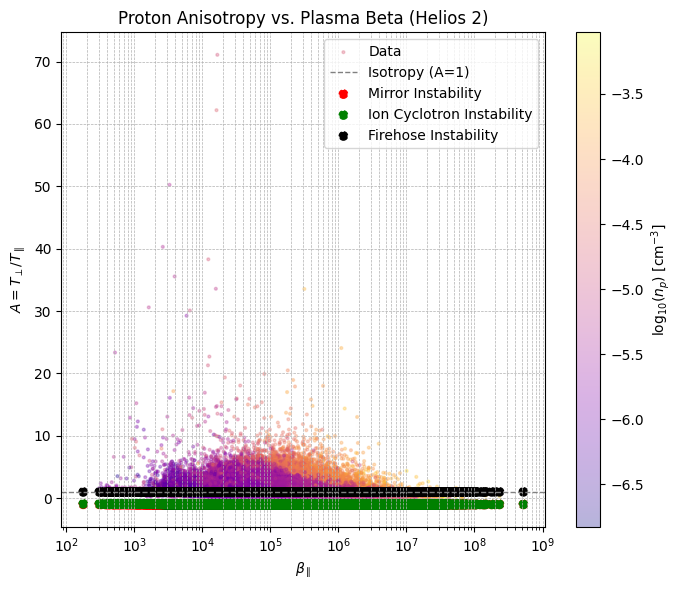

In [ ]:
df = Helios2.copy()

df_clean = df[['A','beta_par','beta','n_p']].dropna().copy()

Helios2['A_mirror'] = 1/Helios2['beta_par'] - 1
Helios2['A_ic'] = 0.6/Helios2['beta_par']**0.4 - 1
Helios2['A_firehose'] = 1 - 2/Helios2['beta_par']

plt.figure(figsize=(7,6))

# Scatter plot colored by density
sc1 = plt.scatter(
    df_clean['beta_par'],
    df_clean['A'],
    c=np.log10(df_clean['n_p']),   # use density in log10
    cmap='plasma',
    s=4,
    alpha=0.3,
    label='Data'
)

plt.xscale('log')
plt.xlabel(r'$\beta_\parallel$')
plt.ylabel(r'$A = T_\perp/T_\parallel$')
plt.title('Proton Anisotropy vs. Plasma Beta (Helios 2)')

# Colorbar
cbar = plt.colorbar(sc1)
cbar.set_label(r'log$_{10}(n_p)$ [cm$^{-3}$]')

# Instability thresholds
plt.axhline(1, color='gray', lw=1, linestyle='--', label='Isotropy (A=1)')
plt.scatter(Helios2['beta_par'], Helios2['A_mirror'], color='red', linestyle='--', label='Mirror Instability')
plt.scatter(Helios2['beta_par'], Helios2['A_ic'], color='green', linestyle='--', label='Ion Cyclotron Instability')
plt.scatter(Helios2['beta_par'], Helios2['A_firehose'], color='black', linestyle='--', label='Firehose Instability')

plt.grid(True, which='both', ls='--', lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()

# References

(1) Perrone, D., Stansby, D., Horbury, T. S., & Matteini, L. (2019). Radial evolution of the solar wind in pure high-speed streams: HELIOS revised observations. Monthly Notices of the royal astronomical society, 483(3), 3730-3737.‏

(2) Stansby, D., Perrone, D., Matteini, L., Horbury, T. S., & Salem, C. S. (2019). Alpha particle thermodynamics in the inner heliosphere fast solar wind. Astronomy & Astrophysics, 623, L2.‏

(3) Stansby, D., Salem, C., Matteini, L., & Horbury, T. (2018). A new inner heliosphere proton parameter dataset from the Helios mission. Solar physics, 293(11), 155.‏

(4) Parker, E. N. (1958). Dynamics of the interplanetary gas and magnetic fields. Astrophysical Journal, vol. 128, p. 664, 128, 664.‏

